In [2]:
# imports
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler 
import torch.backends.cudnn as cudnn 
import numpy as np
import torchvision
from torchvision import datasets, models, transforms 
import matplotlib.pyplot as plt
import math
import time
import os
import copy
import glob
import itertools
from PIL import Image
from tqdm import tqdm
from pathlib import Path
from PIL import Image
from IPython.display import display, Image, clear_output 
import ipywidgets as widgets
import threading
import string

In [3]:
# set random seed for reproducability
torch.manual_seed(111)

In [4]:
# select the correct device
device = ""
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

In [5]:
import os
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader 
from PIL import Image

# establish data transforms
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.Resize((64, 64)), 
    transforms.ToTensor(),
    transforms.Normalize([0.485], [0.229])
])

# define dataset
class SingleClassImageFolder(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.img_names = [img for img in os.listdir(root_dir) if img.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))] 
        
    def __len__(self):
        return len(self.img_names)
    
    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.img_names[idx])
        image = Image.open(img_path)
        image = image.convert('RGB') 
        if self.transform:
            image = self.transform(image)
        return image, 0 
data_dir = './data/train'
letters = os.listdir(data_dir)

gan_datasets = {}
gan_dataloaders = {}

# create new dataset for each letter
for letter in letters:
    letter_path = os.path.join(data_dir, letter) 
    if os.path.isdir(letter_path):
        gan_datasets[letter] = SingleClassImageFolder(root_dir=letter_path, transform=transform)
        gan_dataloaders[letter] = DataLoader(gan_datasets[letter],batch_size=32, shuffle=True, num_workers=0)

print(gan_dataloaders['A'])

In [6]:
# show image, adapted from the professor's PyTorch notebook
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0)) 
    mean = np.array([0.485, 0.456, 0.406]) 
    std = np.array([0.229, 0.224, 0.225]) 
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1) 
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

torch.Size([32, 1, 64, 64])
tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0])
torch.Size([3, 266, 530])


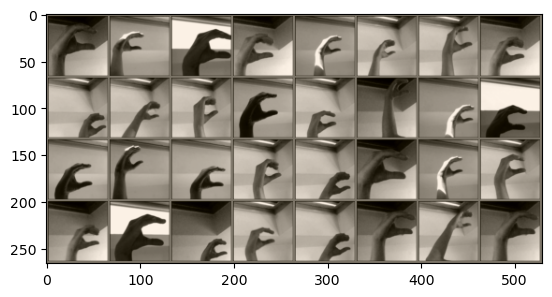

In [7]:
# show a batch, also adapted from the professor's PyTorch notebook
inputs, classes = next(iter(gan_dataloaders['C']))
print(inputs.shape)
print(classes)
# Make a grid from batch
out = torchvision.utils.make_grid(inputs)
print(out.shape)
imshow(out)

In [8]:
# define discriminator model
class Discriminator(nn.Module): 
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(nn.Linear(4096, 2048),
            nn.Dropout(0.3),
            nn.Linear(2048, 1024),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 1),
            nn.Sigmoid(),
        )
    
    def forward(self, x):
        x = x.view(x.size(0), 4096)
        output = self.model(x)
        return output

In [9]:
# define generator model
class Generator(nn.Module): 
    def __init__(self):
        super().__init__()
        self.model = nn.Sequential(
            nn.Linear(100, 512),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(512, 2048),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(2048, 4096),
            nn.Tanh(),
        )
        
    def forward(self, x):
        output = self.model(x)
        output = output.view(x.size(0), 1, 64, 64) 
        return output

In [10]:
# define function to show images in grid
def show_asl(num_images, num_rows, num_cols, generated_samples):
    
    plt.figure(figsize=(64, 64))

    for i in range(num_images):
        plt.subplot(num_rows, num_cols, i+1)
        plt.imshow(generated_samples[i].reshape(64,64), cmap='gray')
        plt.axis('off') 

    plt.tight_layout()
    plt.show()

In [11]:
images_dict = {letter: None for letter in string.ascii_lowercase}

Starting training for letter: R
Completed Epoch 1/50, Epoch Duration: 6.64s, Total Loss D.: 0.0604, Total Loss G.: 2.5746
Completed Epoch 2/50, Epoch Duration: 7.15s, Total Loss D.: 0.0288, Total Loss G.: 3.5501
Completed Epoch 3/50, Epoch Duration: 6.81s, Total Loss D.: 0.2268, Total Loss G.: 1.6223
Completed Epoch 4/50, Epoch Duration: 6.95s, Total Loss D.: 0.7316, Total Loss G.: 0.9092
Completed Epoch 5/50, Epoch Duration: 7.03s, Total Loss D.: 0.0236, Total Loss G.: 3.6411
Completed Epoch 6/50, Epoch Duration: 6.96s, Total Loss D.: 0.2470, Total Loss G.: 1.6052
Completed Epoch 7/50, Epoch Duration: 7.30s, Total Loss D.: 0.1730, Total Loss G.: 2.2212
Completed Epoch 8/50, Epoch Duration: 7.09s, Total Loss D.: 0.1897, Total Loss G.: 5.4258
Completed Epoch 9/50, Epoch Duration: 7.29s, Total Loss D.: 0.0495, Total Loss G.: 3.7191
Completed Epoch 10/50, Epoch Duration: 7.22s, Total Loss D.: 0.1985, Total Loss G.: 2.5269
Completed Epoch 11/50, Epoch Duration: 7.12s, Total Loss D.: 0.1163

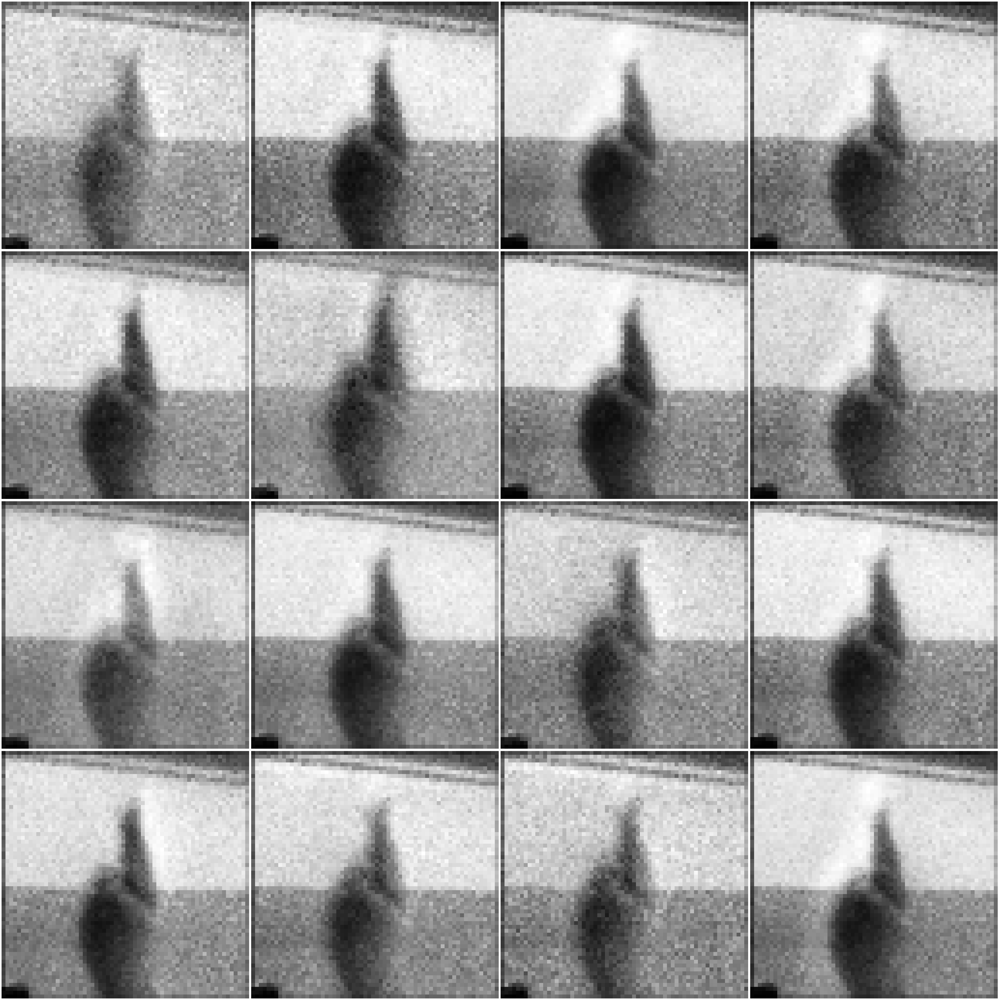

Starting training for letter: U
Completed Epoch 1/50, Epoch Duration: 7.50s, Total Loss D.: 0.0476, Total Loss G.: 2.6461
Completed Epoch 2/50, Epoch Duration: 7.15s, Total Loss D.: 0.0163, Total Loss G.: 3.6756
Completed Epoch 3/50, Epoch Duration: 7.18s, Total Loss D.: 0.0786, Total Loss G.: 2.8992
Completed Epoch 4/50, Epoch Duration: 7.13s, Total Loss D.: 0.1012, Total Loss G.: 4.6675
Completed Epoch 5/50, Epoch Duration: 7.53s, Total Loss D.: 0.0316, Total Loss G.: 5.6873
Completed Epoch 6/50, Epoch Duration: 7.46s, Total Loss D.: 0.0114, Total Loss G.: 12.1697
Completed Epoch 7/50, Epoch Duration: 7.20s, Total Loss D.: 0.1036, Total Loss G.: 2.4781
Completed Epoch 8/50, Epoch Duration: 7.02s, Total Loss D.: 0.0333, Total Loss G.: 5.4572
Completed Epoch 9/50, Epoch Duration: 7.20s, Total Loss D.: 0.1158, Total Loss G.: 5.3633
Completed Epoch 10/50, Epoch Duration: 7.11s, Total Loss D.: 0.2141, Total Loss G.: 1.8202
Completed Epoch 11/50, Epoch Duration: 7.20s, Total Loss D.: 0.305

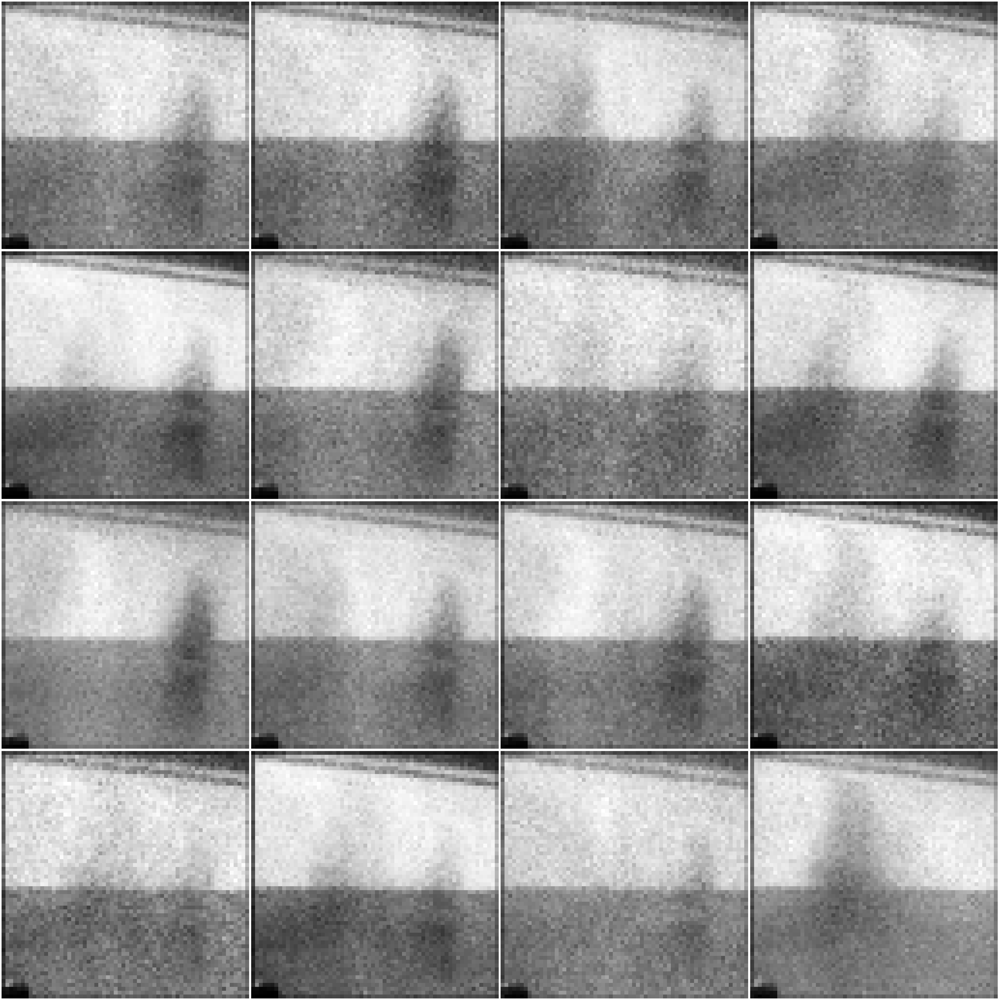

Starting training for letter: I
Completed Epoch 1/50, Epoch Duration: 7.81s, Total Loss D.: 0.0647, Total Loss G.: 2.3477
Completed Epoch 2/50, Epoch Duration: 7.16s, Total Loss D.: 0.0255, Total Loss G.: 3.2987
Completed Epoch 3/50, Epoch Duration: 7.21s, Total Loss D.: 0.0674, Total Loss G.: 2.7100
Completed Epoch 4/50, Epoch Duration: 7.06s, Total Loss D.: 0.2015, Total Loss G.: 6.0447
Completed Epoch 5/50, Epoch Duration: 7.10s, Total Loss D.: 0.1741, Total Loss G.: 2.4568
Completed Epoch 6/50, Epoch Duration: 7.31s, Total Loss D.: 0.0445, Total Loss G.: 4.1523
Completed Epoch 7/50, Epoch Duration: 7.14s, Total Loss D.: 0.0015, Total Loss G.: 9.4511
Completed Epoch 8/50, Epoch Duration: 7.20s, Total Loss D.: 0.3546, Total Loss G.: 2.6593
Completed Epoch 9/50, Epoch Duration: 7.05s, Total Loss D.: 0.0956, Total Loss G.: 4.9396
Completed Epoch 10/50, Epoch Duration: 6.92s, Total Loss D.: 0.2026, Total Loss G.: 2.9237
Completed Epoch 11/50, Epoch Duration: 7.12s, Total Loss D.: 0.0505

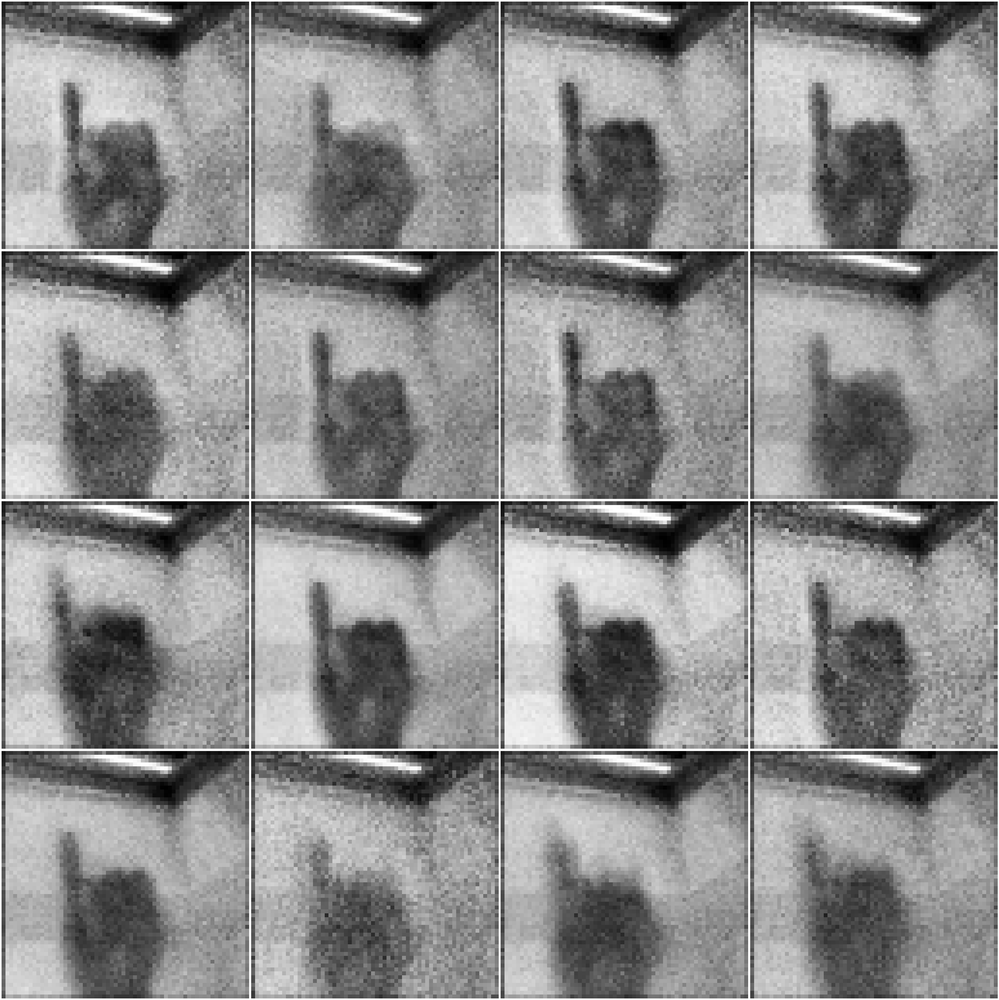

Starting training for letter: N
Completed Epoch 1/50, Epoch Duration: 7.85s, Total Loss D.: 0.0831, Total Loss G.: 2.4211
Completed Epoch 2/50, Epoch Duration: 7.12s, Total Loss D.: 0.0391, Total Loss G.: 2.8639
Completed Epoch 3/50, Epoch Duration: 7.66s, Total Loss D.: 0.2543, Total Loss G.: 1.5883
Completed Epoch 4/50, Epoch Duration: 7.17s, Total Loss D.: 0.0177, Total Loss G.: 4.9649
Completed Epoch 5/50, Epoch Duration: 7.06s, Total Loss D.: 0.0188, Total Loss G.: 6.7545
Completed Epoch 6/50, Epoch Duration: 7.03s, Total Loss D.: 0.0396, Total Loss G.: 4.2699
Completed Epoch 7/50, Epoch Duration: 7.20s, Total Loss D.: 0.1573, Total Loss G.: 21.2045
Completed Epoch 8/50, Epoch Duration: 7.16s, Total Loss D.: 0.0024, Total Loss G.: 8.3021
Completed Epoch 9/50, Epoch Duration: 7.01s, Total Loss D.: 0.0866, Total Loss G.: 5.2989
Completed Epoch 10/50, Epoch Duration: 7.00s, Total Loss D.: 0.1150, Total Loss G.: 2.9290
Completed Epoch 11/50, Epoch Duration: 7.04s, Total Loss D.: 0.023

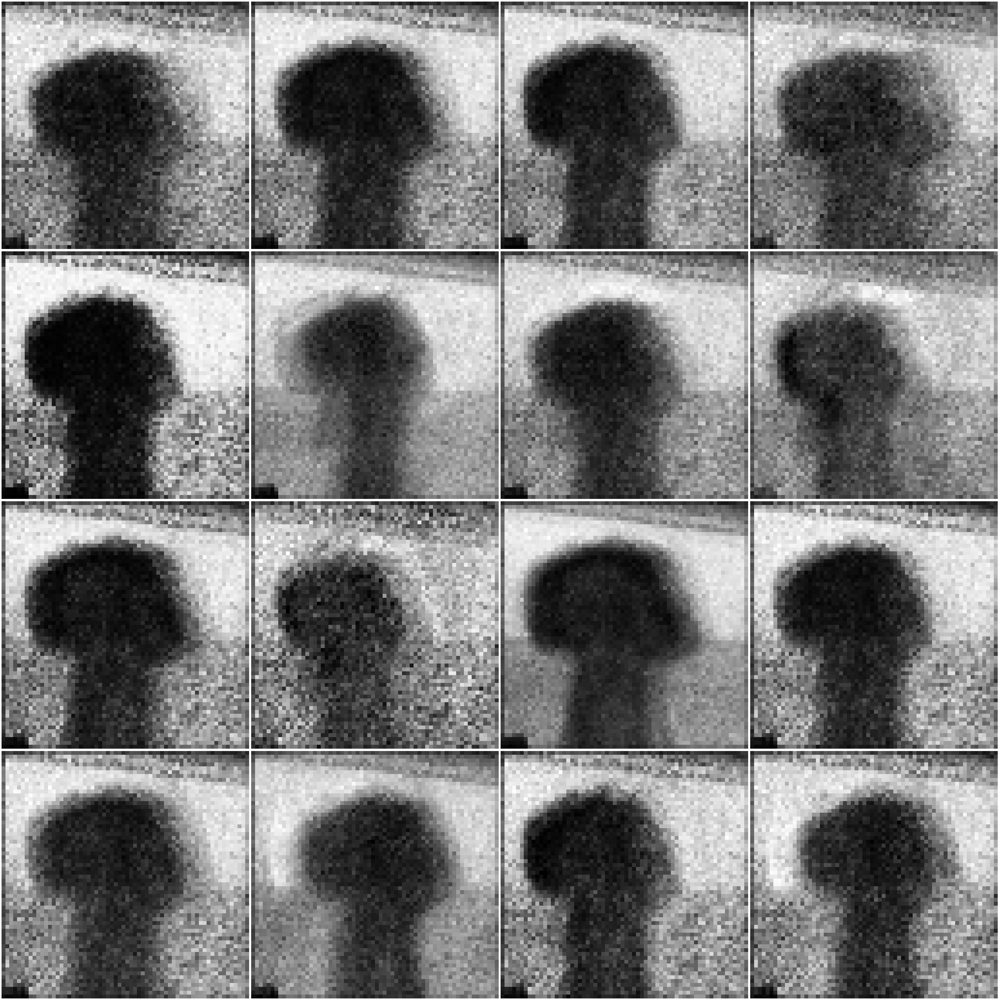

Starting training for letter: G
Completed Epoch 1/50, Epoch Duration: 7.34s, Total Loss D.: 0.0613, Total Loss G.: 2.5644
Completed Epoch 2/50, Epoch Duration: 6.74s, Total Loss D.: 0.0475, Total Loss G.: 2.7038
Completed Epoch 3/50, Epoch Duration: 6.93s, Total Loss D.: 0.0415, Total Loss G.: 2.9901
Completed Epoch 4/50, Epoch Duration: 6.74s, Total Loss D.: 0.2786, Total Loss G.: 1.6172
Completed Epoch 5/50, Epoch Duration: 6.92s, Total Loss D.: 0.0126, Total Loss G.: 7.2111
Completed Epoch 6/50, Epoch Duration: 6.91s, Total Loss D.: 0.0571, Total Loss G.: 4.9358
Completed Epoch 7/50, Epoch Duration: 6.81s, Total Loss D.: 0.0235, Total Loss G.: 3.5241
Completed Epoch 8/50, Epoch Duration: 6.68s, Total Loss D.: 0.0383, Total Loss G.: 4.4813
Completed Epoch 9/50, Epoch Duration: 6.77s, Total Loss D.: 0.2290, Total Loss G.: 2.6142
Completed Epoch 10/50, Epoch Duration: 6.76s, Total Loss D.: 0.2269, Total Loss G.: 4.5507
Completed Epoch 11/50, Epoch Duration: 6.75s, Total Loss D.: 0.1219

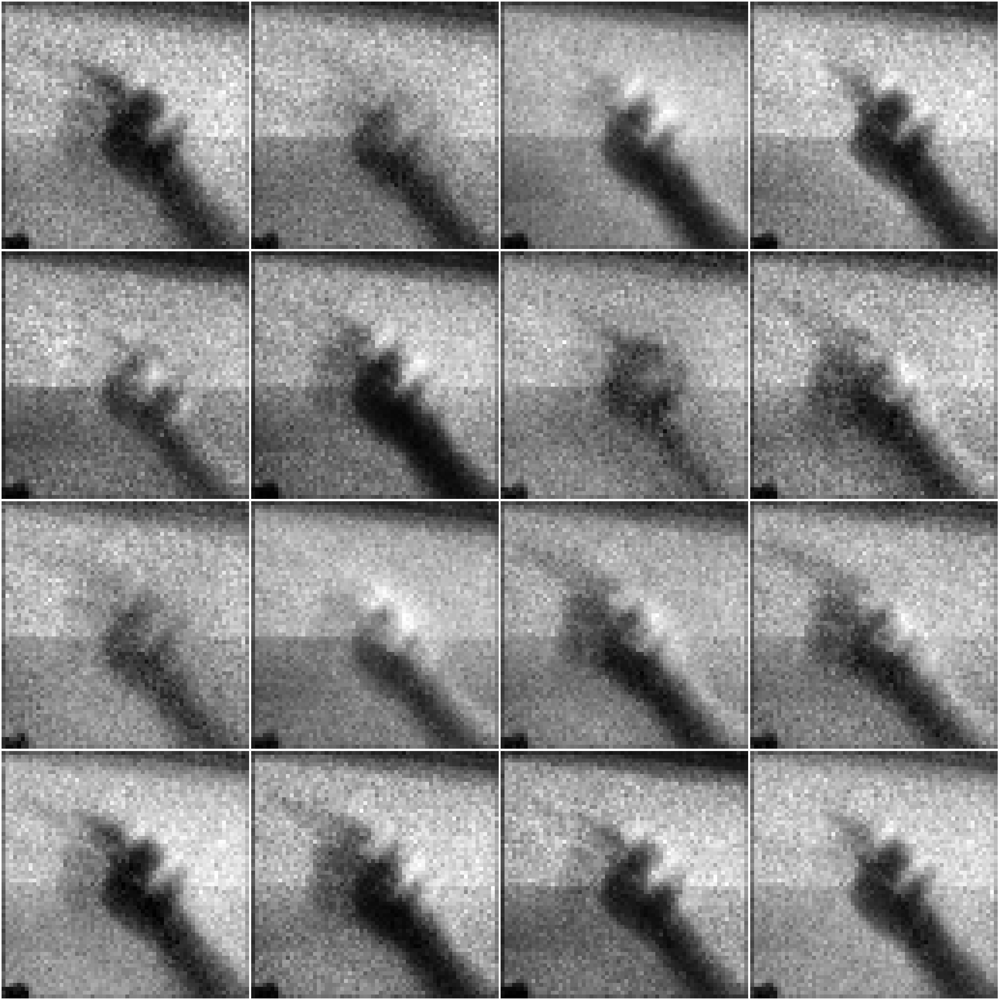

Starting training for letter: Z
Completed Epoch 1/50, Epoch Duration: 7.28s, Total Loss D.: 0.0709, Total Loss G.: 2.2673
Completed Epoch 2/50, Epoch Duration: 6.67s, Total Loss D.: 0.0496, Total Loss G.: 2.5992
Completed Epoch 3/50, Epoch Duration: 6.66s, Total Loss D.: 0.0762, Total Loss G.: 2.4887
Completed Epoch 4/50, Epoch Duration: 6.72s, Total Loss D.: 0.2559, Total Loss G.: 4.6795
Completed Epoch 5/50, Epoch Duration: 6.65s, Total Loss D.: 0.0061, Total Loss G.: 8.0941
Completed Epoch 6/50, Epoch Duration: 6.70s, Total Loss D.: 0.0309, Total Loss G.: 3.5695
Completed Epoch 7/50, Epoch Duration: 7.00s, Total Loss D.: 0.4987, Total Loss G.: 3.6441
Completed Epoch 8/50, Epoch Duration: 6.68s, Total Loss D.: 0.5740, Total Loss G.: 5.3916
Completed Epoch 9/50, Epoch Duration: 6.69s, Total Loss D.: 0.0819, Total Loss G.: 3.5725
Completed Epoch 10/50, Epoch Duration: 6.71s, Total Loss D.: 0.3497, Total Loss G.: 2.1714
Completed Epoch 11/50, Epoch Duration: 6.67s, Total Loss D.: 0.1567

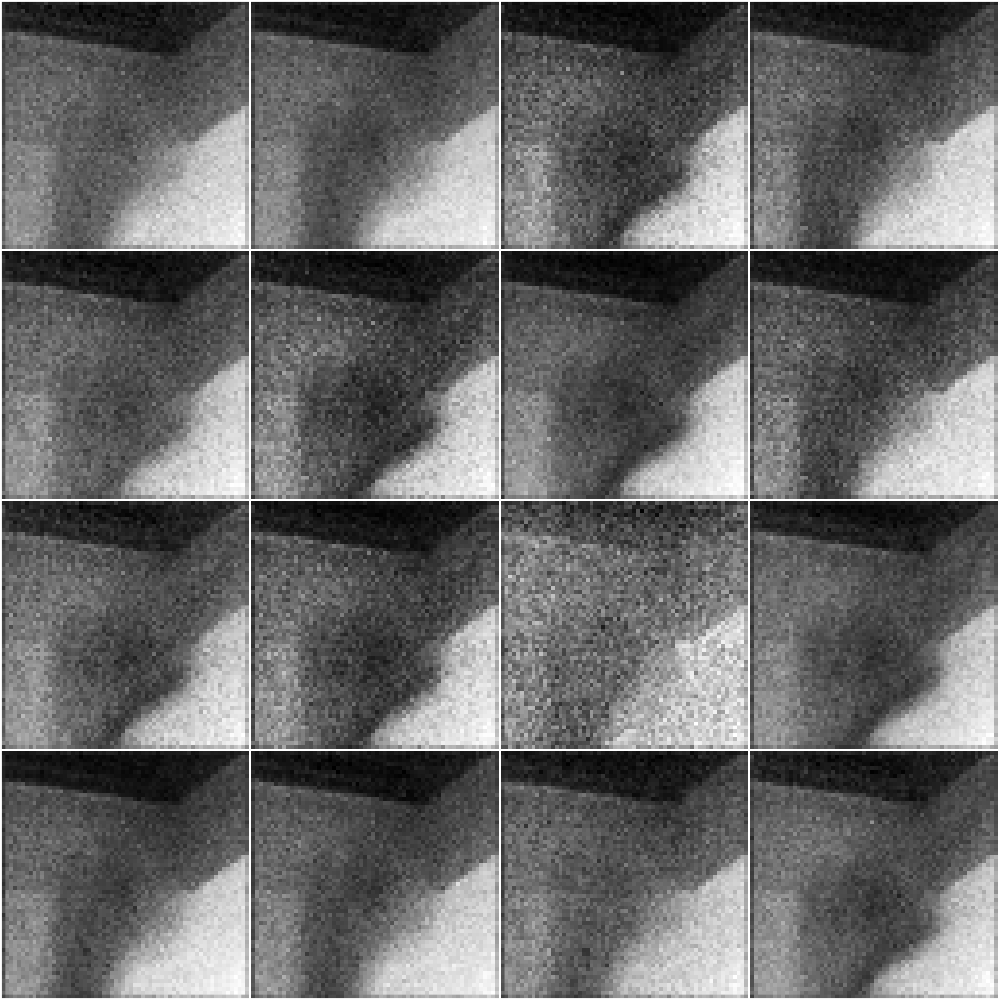

Starting training for letter: T
Completed Epoch 1/50, Epoch Duration: 7.46s, Total Loss D.: 0.0580, Total Loss G.: 2.6781
Completed Epoch 2/50, Epoch Duration: 6.94s, Total Loss D.: 0.0273, Total Loss G.: 3.1225
Completed Epoch 3/50, Epoch Duration: 6.94s, Total Loss D.: 0.2712, Total Loss G.: 2.5689
Completed Epoch 4/50, Epoch Duration: 6.76s, Total Loss D.: 0.9946, Total Loss G.: 2.2265
Completed Epoch 5/50, Epoch Duration: 6.66s, Total Loss D.: 0.0619, Total Loss G.: 2.8235
Completed Epoch 6/50, Epoch Duration: 6.69s, Total Loss D.: 0.0691, Total Loss G.: 3.0174
Completed Epoch 7/50, Epoch Duration: 6.67s, Total Loss D.: 0.2707, Total Loss G.: 1.2901
Completed Epoch 8/50, Epoch Duration: 6.70s, Total Loss D.: 0.1208, Total Loss G.: 4.4327
Completed Epoch 9/50, Epoch Duration: 7.08s, Total Loss D.: 0.1068, Total Loss G.: 3.2411
Completed Epoch 10/50, Epoch Duration: 6.92s, Total Loss D.: 0.1250, Total Loss G.: 2.2662
Completed Epoch 11/50, Epoch Duration: 6.71s, Total Loss D.: 0.0267

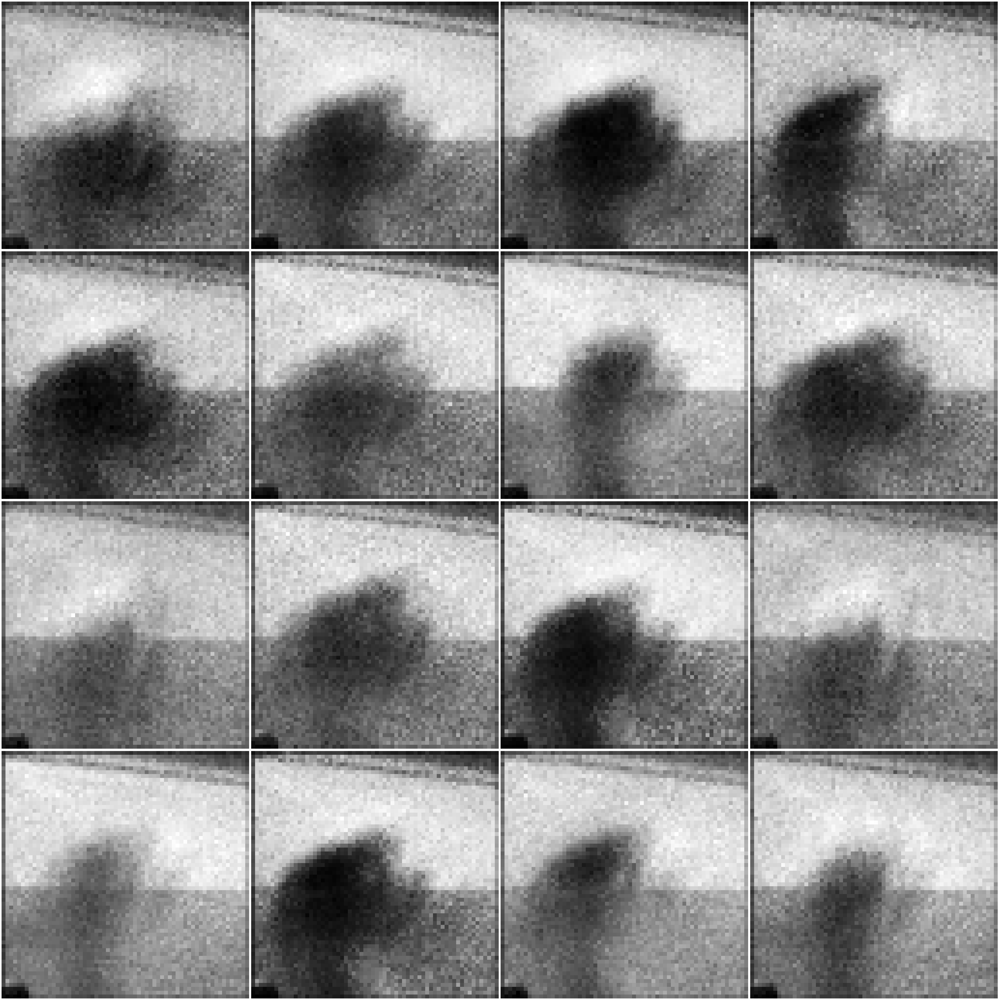

Starting training for letter: S
Completed Epoch 1/50, Epoch Duration: 7.77s, Total Loss D.: 0.0541, Total Loss G.: 2.5715
Completed Epoch 2/50, Epoch Duration: 7.29s, Total Loss D.: 0.0174, Total Loss G.: 4.1034
Completed Epoch 3/50, Epoch Duration: 7.15s, Total Loss D.: 0.0315, Total Loss G.: 3.7366
Completed Epoch 4/50, Epoch Duration: 7.22s, Total Loss D.: 1.7408, Total Loss G.: 2.6264
Completed Epoch 5/50, Epoch Duration: 7.33s, Total Loss D.: 0.0029, Total Loss G.: 8.1523
Completed Epoch 6/50, Epoch Duration: 7.28s, Total Loss D.: 0.0212, Total Loss G.: 4.8611
Completed Epoch 7/50, Epoch Duration: 7.33s, Total Loss D.: 0.4022, Total Loss G.: 7.4448
Completed Epoch 8/50, Epoch Duration: 6.77s, Total Loss D.: 0.1009, Total Loss G.: 3.2277
Completed Epoch 9/50, Epoch Duration: 6.92s, Total Loss D.: 0.0453, Total Loss G.: 2.8370
Completed Epoch 10/50, Epoch Duration: 6.75s, Total Loss D.: 0.0672, Total Loss G.: 4.9690
Completed Epoch 11/50, Epoch Duration: 6.76s, Total Loss D.: 0.0895

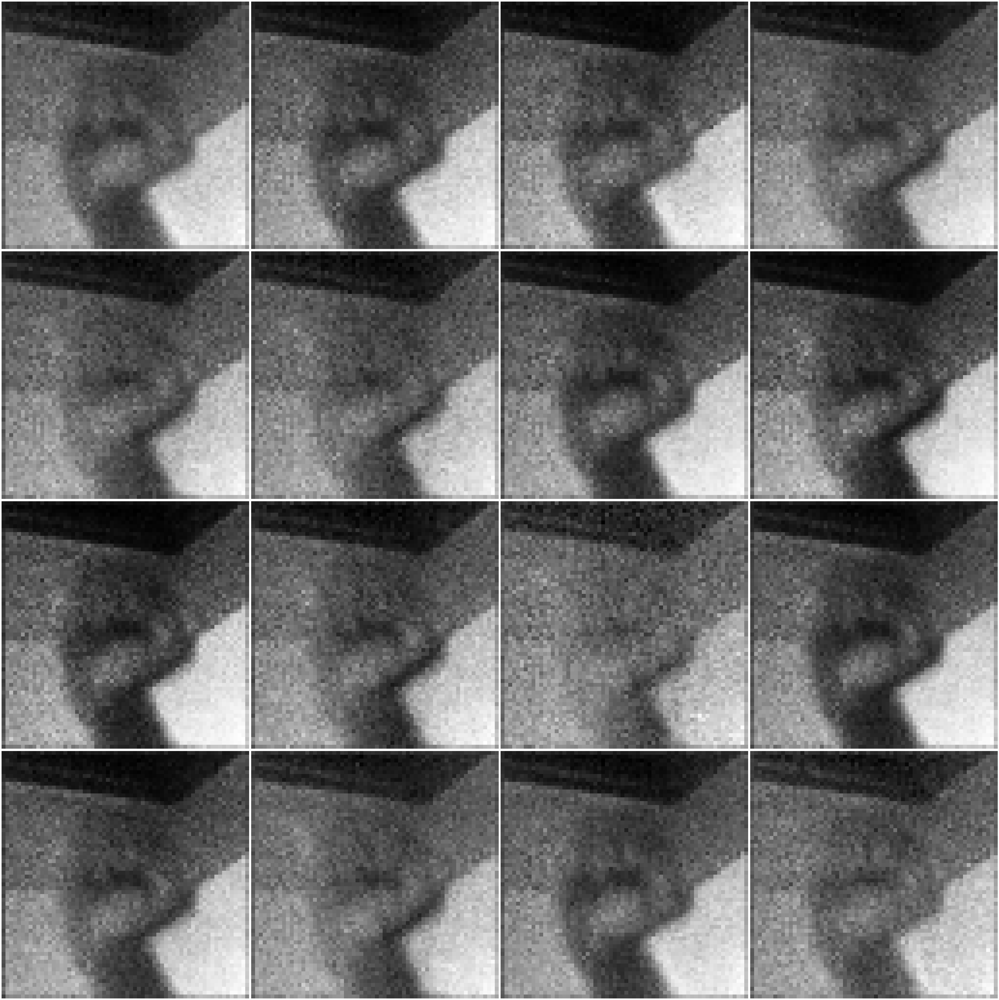

Starting training for letter: A
Completed Epoch 1/50, Epoch Duration: 7.40s, Total Loss D.: 0.0663, Total Loss G.: 2.5986
Completed Epoch 2/50, Epoch Duration: 6.98s, Total Loss D.: 0.0260, Total Loss G.: 3.1654
Completed Epoch 3/50, Epoch Duration: 6.93s, Total Loss D.: 0.0526, Total Loss G.: 2.4480
Completed Epoch 4/50, Epoch Duration: 6.87s, Total Loss D.: 0.1957, Total Loss G.: 4.1495
Completed Epoch 5/50, Epoch Duration: 6.91s, Total Loss D.: 0.0807, Total Loss G.: 3.4826
Completed Epoch 6/50, Epoch Duration: 7.20s, Total Loss D.: 0.0704, Total Loss G.: 5.7442
Completed Epoch 7/50, Epoch Duration: 8.36s, Total Loss D.: 0.0464, Total Loss G.: 8.5515
Completed Epoch 8/50, Epoch Duration: 8.15s, Total Loss D.: 0.0830, Total Loss G.: 6.0064
Completed Epoch 9/50, Epoch Duration: 8.59s, Total Loss D.: 0.0041, Total Loss G.: 8.7001
Completed Epoch 10/50, Epoch Duration: 8.54s, Total Loss D.: 0.0570, Total Loss G.: 5.0110
Completed Epoch 11/50, Epoch Duration: 8.62s, Total Loss D.: 0.1109

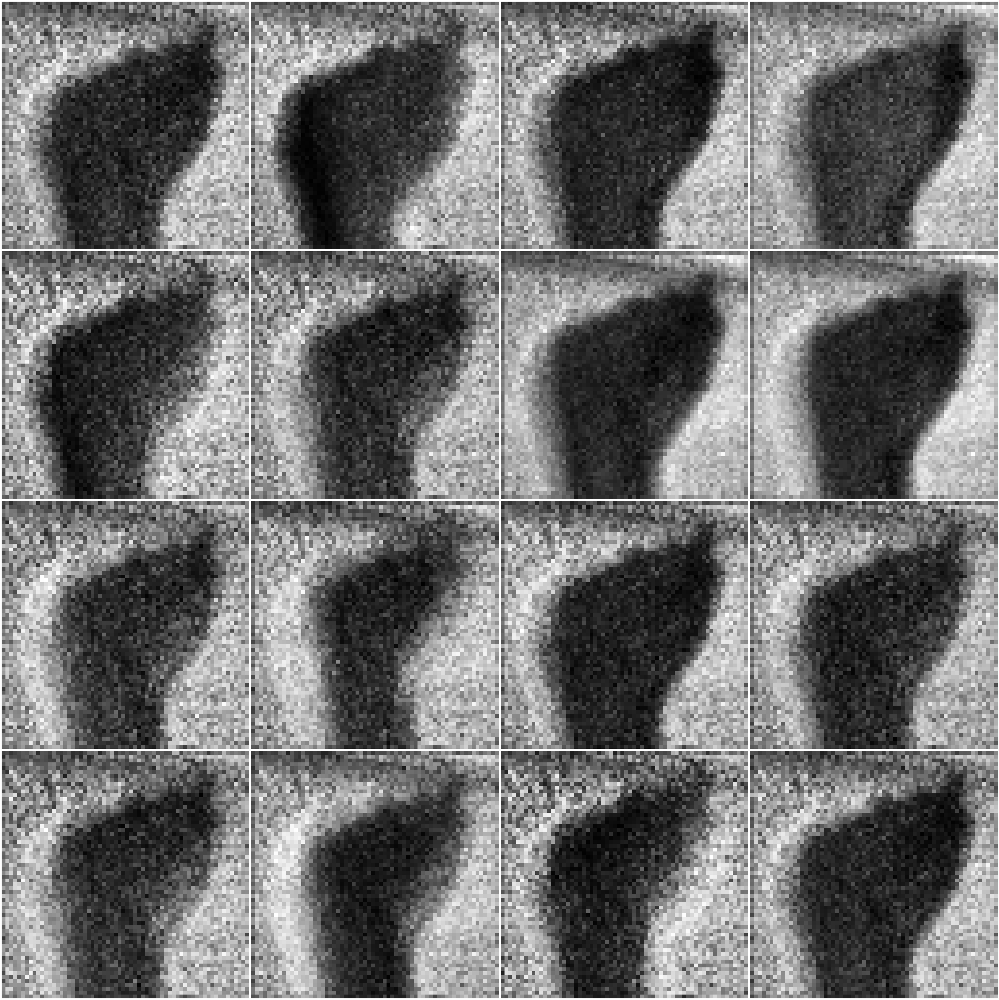

Starting training for letter: F
Completed Epoch 1/50, Epoch Duration: 7.74s, Total Loss D.: 0.0628, Total Loss G.: 2.6046
Completed Epoch 2/50, Epoch Duration: 7.32s, Total Loss D.: 0.0325, Total Loss G.: 3.0242
Completed Epoch 3/50, Epoch Duration: 7.25s, Total Loss D.: 0.0351, Total Loss G.: 4.2283
Completed Epoch 4/50, Epoch Duration: 7.26s, Total Loss D.: 0.0321, Total Loss G.: 2.9800
Completed Epoch 5/50, Epoch Duration: 7.26s, Total Loss D.: 0.0087, Total Loss G.: 5.3750
Completed Epoch 6/50, Epoch Duration: 7.21s, Total Loss D.: 0.0064, Total Loss G.: 8.5713
Completed Epoch 7/50, Epoch Duration: 7.22s, Total Loss D.: 0.0000, Total Loss G.: 16.9758
Completed Epoch 8/50, Epoch Duration: 7.25s, Total Loss D.: 0.2417, Total Loss G.: 8.1094
Completed Epoch 9/50, Epoch Duration: 7.08s, Total Loss D.: 0.1039, Total Loss G.: 5.7889
Completed Epoch 10/50, Epoch Duration: 7.12s, Total Loss D.: 0.2739, Total Loss G.: 3.1373
Completed Epoch 11/50, Epoch Duration: 7.05s, Total Loss D.: 0.172

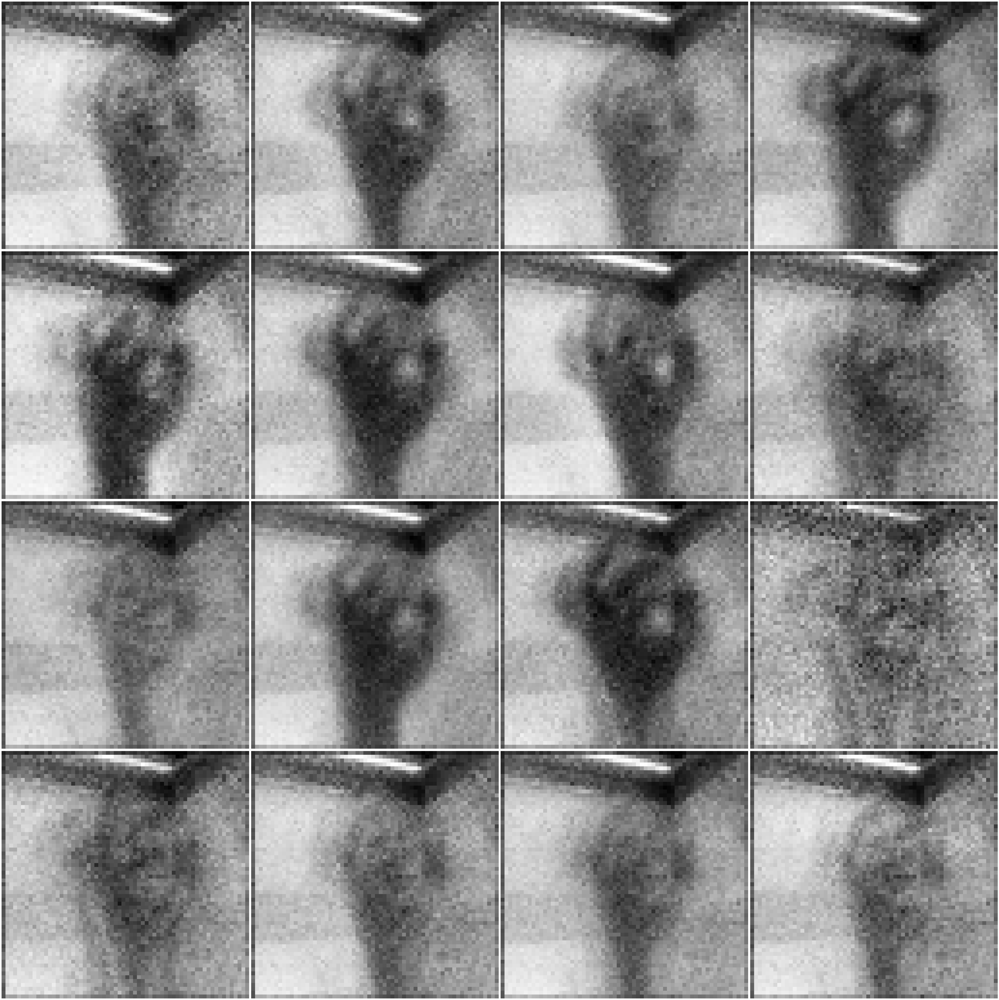

Starting training for letter: O
Completed Epoch 1/50, Epoch Duration: 7.32s, Total Loss D.: 0.0562, Total Loss G.: 2.5175
Completed Epoch 2/50, Epoch Duration: 6.87s, Total Loss D.: 0.0239, Total Loss G.: 2.9945
Completed Epoch 3/50, Epoch Duration: 6.87s, Total Loss D.: 0.2757, Total Loss G.: 1.7655
Completed Epoch 4/50, Epoch Duration: 6.59s, Total Loss D.: 0.0247, Total Loss G.: 5.5793
Completed Epoch 5/50, Epoch Duration: 6.70s, Total Loss D.: 0.5812, Total Loss G.: 1.3869
Completed Epoch 6/50, Epoch Duration: 6.70s, Total Loss D.: 0.1386, Total Loss G.: 3.0102
Completed Epoch 7/50, Epoch Duration: 6.78s, Total Loss D.: 0.0946, Total Loss G.: 3.9236
Completed Epoch 8/50, Epoch Duration: 6.71s, Total Loss D.: 0.3003, Total Loss G.: 1.7924
Completed Epoch 9/50, Epoch Duration: 6.66s, Total Loss D.: 0.0376, Total Loss G.: 3.5094
Completed Epoch 10/50, Epoch Duration: 6.76s, Total Loss D.: 0.0251, Total Loss G.: 3.9907
Completed Epoch 11/50, Epoch Duration: 6.75s, Total Loss D.: 0.0479

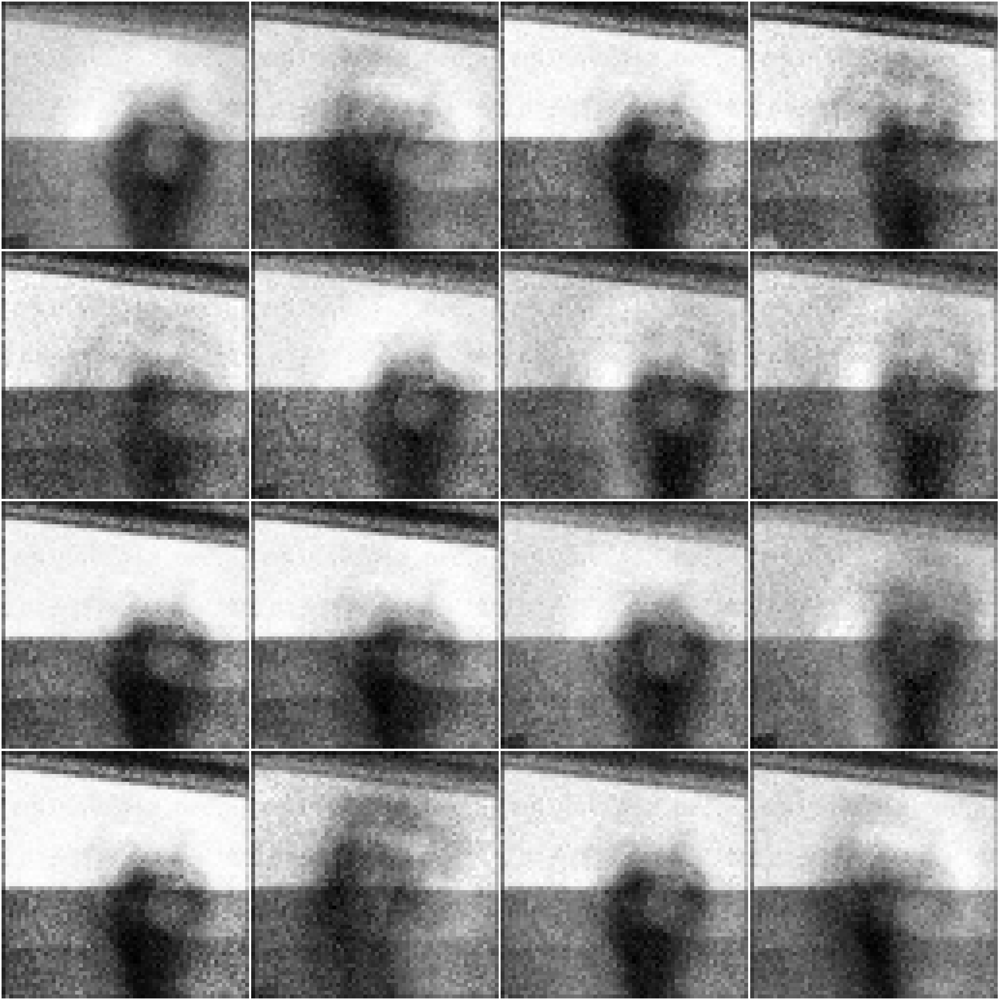

Starting training for letter: H
Completed Epoch 1/50, Epoch Duration: 7.26s, Total Loss D.: 0.0704, Total Loss G.: 2.6685
Completed Epoch 2/50, Epoch Duration: 6.66s, Total Loss D.: 0.0227, Total Loss G.: 3.6541
Completed Epoch 3/50, Epoch Duration: 6.72s, Total Loss D.: 0.0411, Total Loss G.: 2.8794
Completed Epoch 4/50, Epoch Duration: 6.69s, Total Loss D.: 0.0331, Total Loss G.: 3.7371
Completed Epoch 5/50, Epoch Duration: 6.73s, Total Loss D.: 0.0398, Total Loss G.: 3.1079
Completed Epoch 6/50, Epoch Duration: 6.66s, Total Loss D.: 0.0408, Total Loss G.: 3.1304
Completed Epoch 7/50, Epoch Duration: 6.60s, Total Loss D.: 0.0063, Total Loss G.: 5.4213
Completed Epoch 8/50, Epoch Duration: 6.83s, Total Loss D.: 0.1174, Total Loss G.: 2.7977
Completed Epoch 9/50, Epoch Duration: 6.65s, Total Loss D.: 0.2841, Total Loss G.: 6.1223
Completed Epoch 10/50, Epoch Duration: 6.75s, Total Loss D.: 0.3027, Total Loss G.: 2.0655
Completed Epoch 11/50, Epoch Duration: 6.94s, Total Loss D.: 0.0156

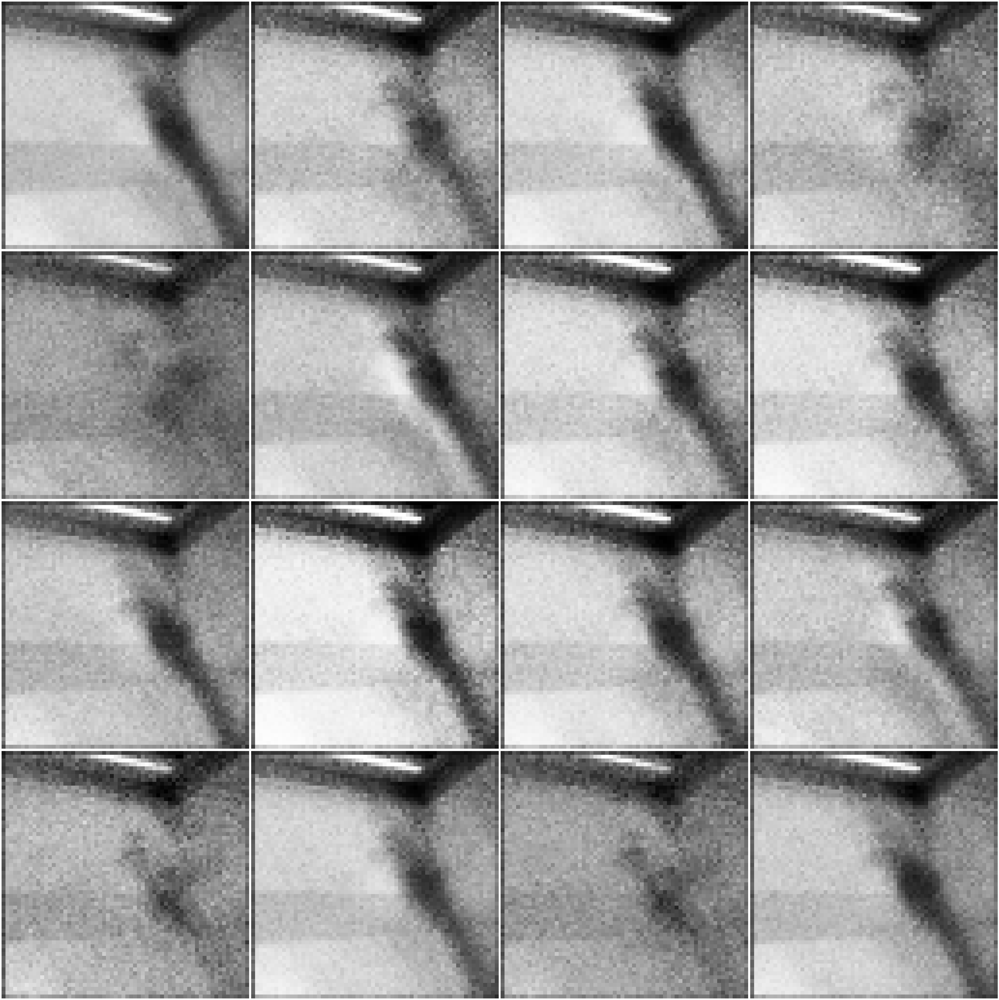

Starting training for letter: M
Completed Epoch 1/50, Epoch Duration: 7.37s, Total Loss D.: 0.0516, Total Loss G.: 2.4197
Completed Epoch 2/50, Epoch Duration: 6.67s, Total Loss D.: 0.0153, Total Loss G.: 3.7906
Completed Epoch 3/50, Epoch Duration: 6.80s, Total Loss D.: 0.0911, Total Loss G.: 1.9224
Completed Epoch 4/50, Epoch Duration: 6.56s, Total Loss D.: 0.1863, Total Loss G.: 2.0560
Completed Epoch 5/50, Epoch Duration: 6.75s, Total Loss D.: 0.0198, Total Loss G.: 5.1949
Completed Epoch 6/50, Epoch Duration: 6.83s, Total Loss D.: 0.0059, Total Loss G.: 10.3297
Completed Epoch 7/50, Epoch Duration: 6.68s, Total Loss D.: 0.2046, Total Loss G.: 2.5390
Completed Epoch 8/50, Epoch Duration: 6.66s, Total Loss D.: 0.0205, Total Loss G.: 4.7595
Completed Epoch 9/50, Epoch Duration: 6.66s, Total Loss D.: 0.1264, Total Loss G.: 5.8050
Completed Epoch 10/50, Epoch Duration: 6.91s, Total Loss D.: 0.4433, Total Loss G.: 2.1893
Completed Epoch 11/50, Epoch Duration: 6.68s, Total Loss D.: 0.048

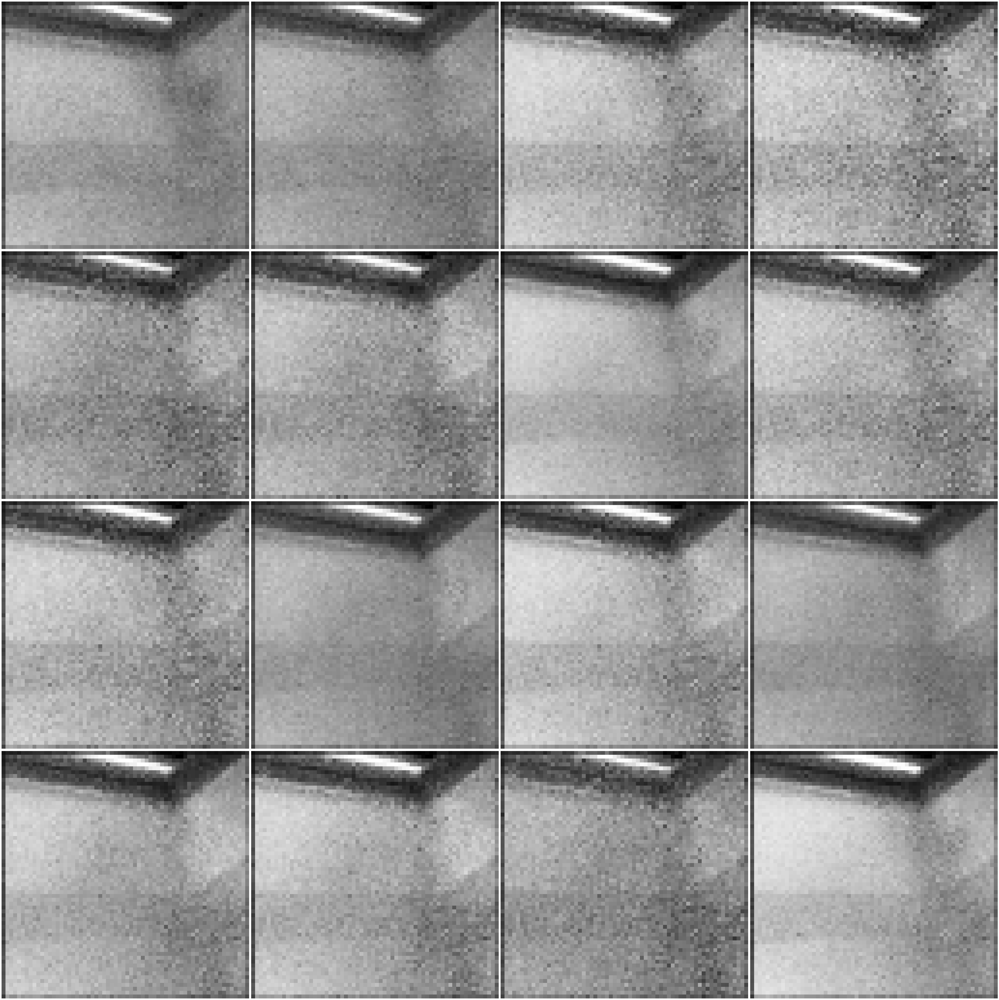

Starting training for letter: J
Completed Epoch 1/50, Epoch Duration: 7.33s, Total Loss D.: 0.0686, Total Loss G.: 2.4138
Completed Epoch 2/50, Epoch Duration: 6.75s, Total Loss D.: 0.0290, Total Loss G.: 2.9143
Completed Epoch 3/50, Epoch Duration: 7.05s, Total Loss D.: 0.3306, Total Loss G.: 3.0300
Completed Epoch 4/50, Epoch Duration: 6.70s, Total Loss D.: 0.3078, Total Loss G.: 0.9659
Completed Epoch 5/50, Epoch Duration: 6.73s, Total Loss D.: 0.0189, Total Loss G.: 5.8576
Completed Epoch 6/50, Epoch Duration: 6.79s, Total Loss D.: 0.1758, Total Loss G.: 2.3677
Completed Epoch 7/50, Epoch Duration: 6.90s, Total Loss D.: 0.0921, Total Loss G.: 2.9140
Completed Epoch 8/50, Epoch Duration: 6.73s, Total Loss D.: 0.2843, Total Loss G.: 2.4027
Completed Epoch 9/50, Epoch Duration: 6.74s, Total Loss D.: 0.1394, Total Loss G.: 3.8788
Completed Epoch 10/50, Epoch Duration: 6.77s, Total Loss D.: 0.0419, Total Loss G.: 5.3009
Completed Epoch 11/50, Epoch Duration: 6.94s, Total Loss D.: 0.2296

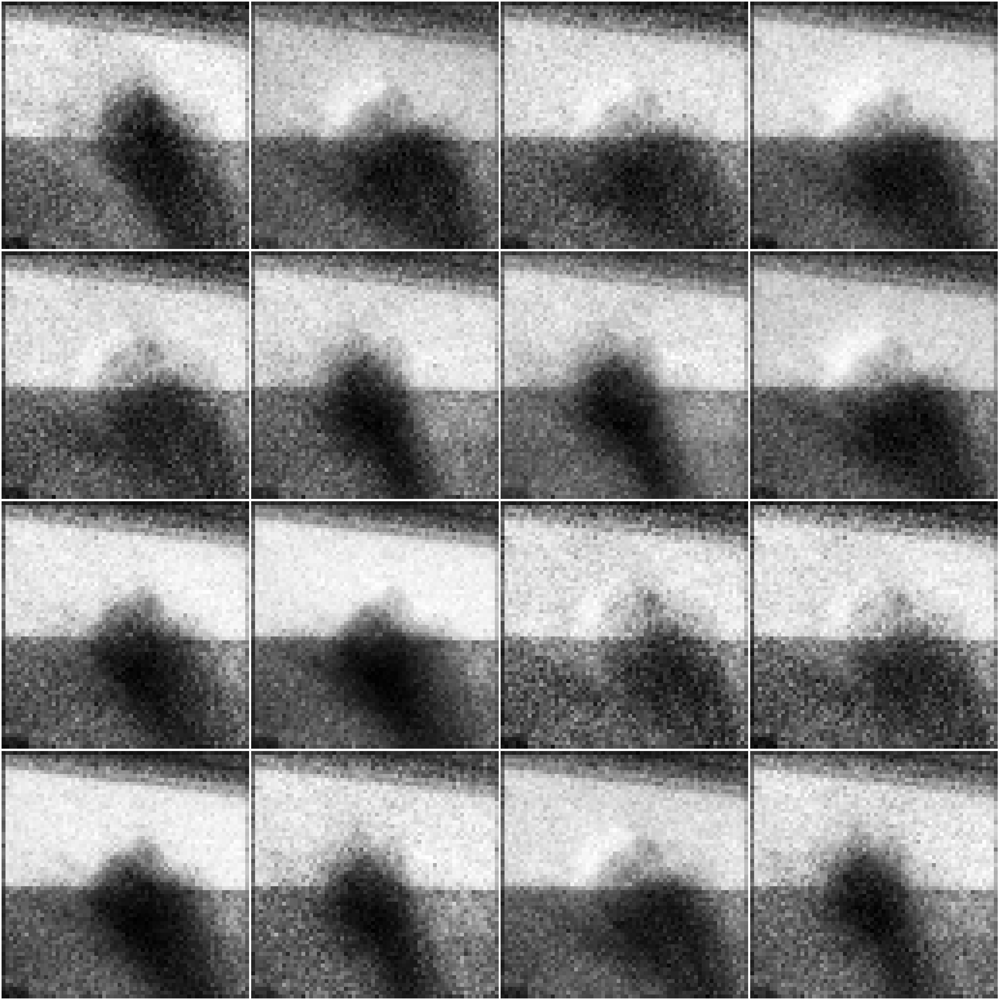

Starting training for letter: C
Completed Epoch 1/50, Epoch Duration: 7.26s, Total Loss D.: 0.0876, Total Loss G.: 2.3802
Completed Epoch 2/50, Epoch Duration: 6.89s, Total Loss D.: 0.0329, Total Loss G.: 3.0904
Completed Epoch 3/50, Epoch Duration: 6.80s, Total Loss D.: 0.0685, Total Loss G.: 2.3271
Completed Epoch 4/50, Epoch Duration: 6.83s, Total Loss D.: 0.2034, Total Loss G.: 1.2917
Completed Epoch 5/50, Epoch Duration: 6.86s, Total Loss D.: 0.1786, Total Loss G.: 3.2112
Completed Epoch 6/50, Epoch Duration: 6.74s, Total Loss D.: 0.4668, Total Loss G.: 2.2560
Completed Epoch 7/50, Epoch Duration: 6.76s, Total Loss D.: 0.3926, Total Loss G.: 5.8381
Completed Epoch 8/50, Epoch Duration: 6.79s, Total Loss D.: 0.5523, Total Loss G.: 0.5497
Completed Epoch 9/50, Epoch Duration: 6.81s, Total Loss D.: 0.0927, Total Loss G.: 8.8554
Completed Epoch 10/50, Epoch Duration: 6.81s, Total Loss D.: 0.3566, Total Loss G.: 4.1802
Completed Epoch 11/50, Epoch Duration: 6.71s, Total Loss D.: 0.0401

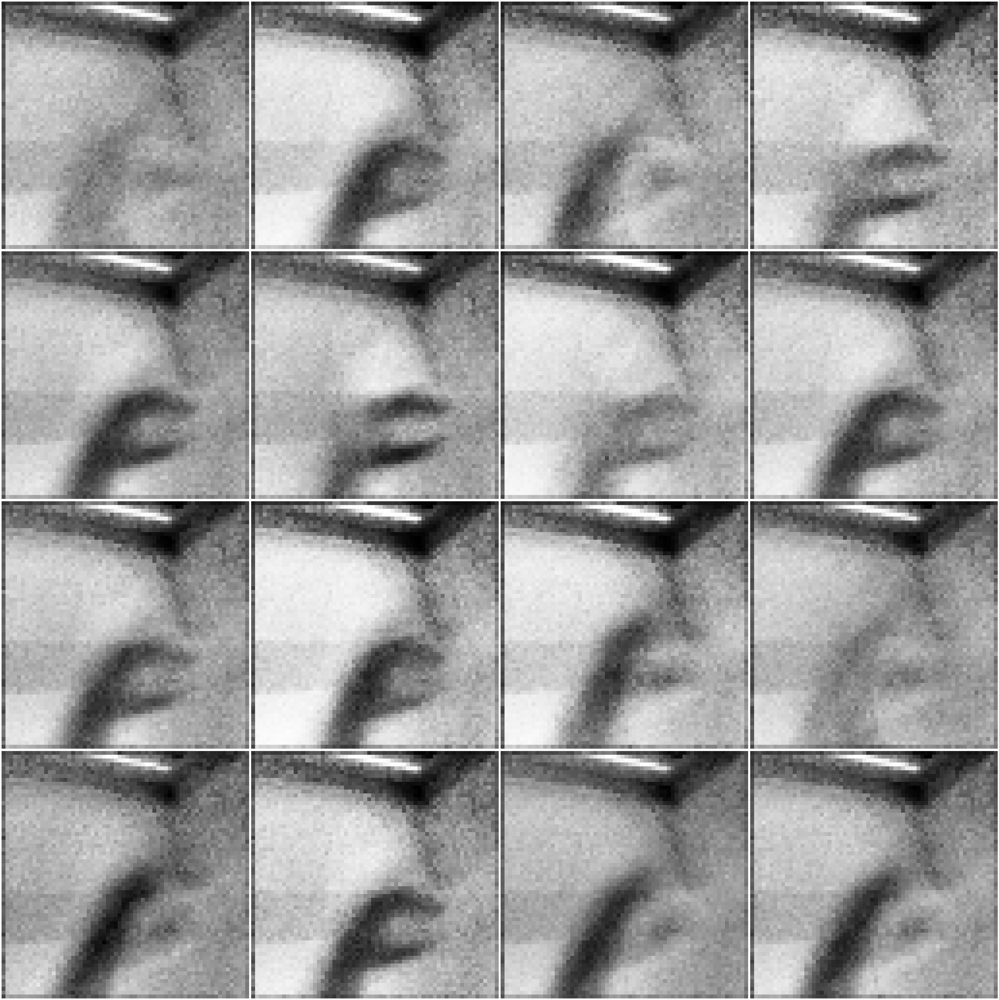

Starting training for letter: D
Completed Epoch 1/50, Epoch Duration: 8.29s, Total Loss D.: 0.0683, Total Loss G.: 2.4544
Completed Epoch 2/50, Epoch Duration: 7.83s, Total Loss D.: 0.0207, Total Loss G.: 3.3318
Completed Epoch 3/50, Epoch Duration: 7.53s, Total Loss D.: 0.1451, Total Loss G.: 1.6749
Completed Epoch 4/50, Epoch Duration: 7.88s, Total Loss D.: 0.0206, Total Loss G.: 5.5421
Completed Epoch 5/50, Epoch Duration: 7.63s, Total Loss D.: 0.0470, Total Loss G.: 3.3020
Completed Epoch 6/50, Epoch Duration: 7.52s, Total Loss D.: 0.0058, Total Loss G.: 9.4125
Completed Epoch 7/50, Epoch Duration: 7.15s, Total Loss D.: 0.4806, Total Loss G.: 20.8692
Completed Epoch 8/50, Epoch Duration: 6.81s, Total Loss D.: 0.1513, Total Loss G.: 8.5797
Completed Epoch 9/50, Epoch Duration: 6.81s, Total Loss D.: 1.2061, Total Loss G.: 29.9669
Completed Epoch 10/50, Epoch Duration: 6.78s, Total Loss D.: 0.0712, Total Loss G.: 4.8545
Completed Epoch 11/50, Epoch Duration: 6.76s, Total Loss D.: 0.30

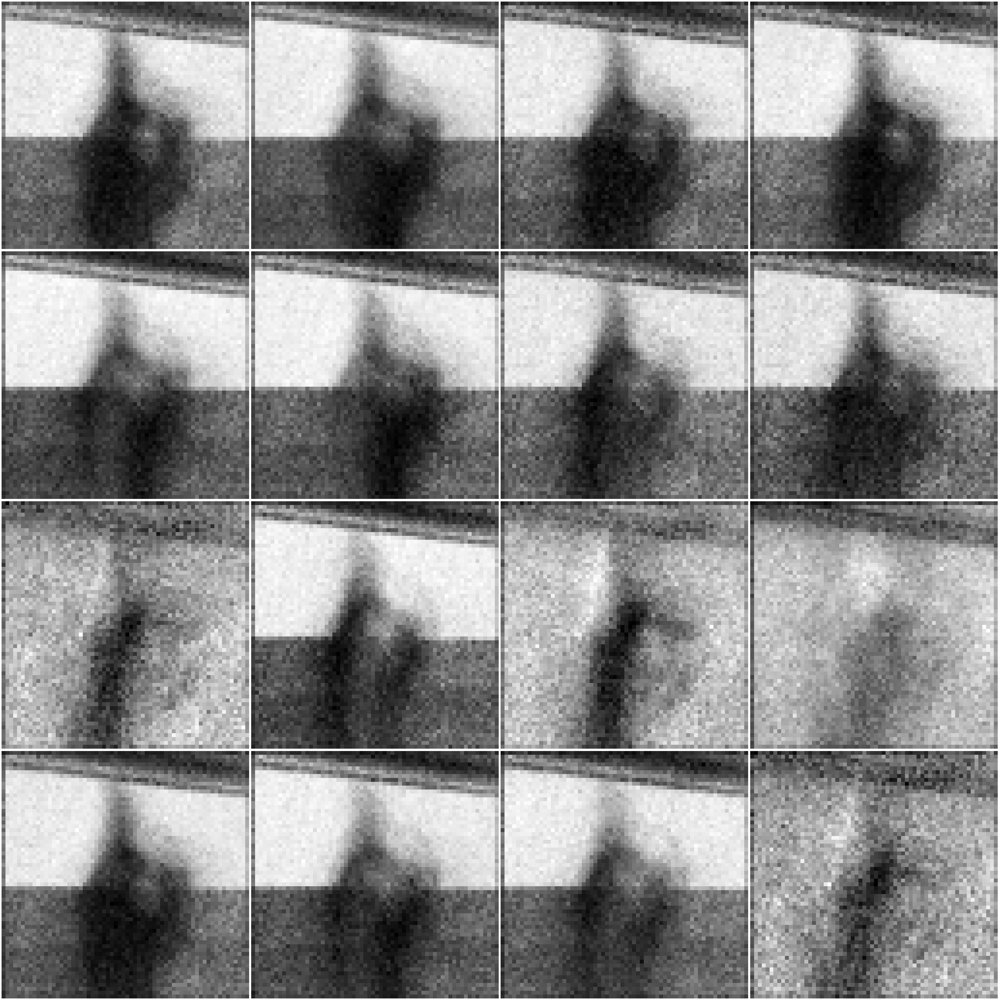

Starting training for letter: V
Completed Epoch 1/50, Epoch Duration: 7.29s, Total Loss D.: 0.0595, Total Loss G.: 2.5830
Completed Epoch 2/50, Epoch Duration: 6.60s, Total Loss D.: 0.0211, Total Loss G.: 3.1714
Completed Epoch 3/50, Epoch Duration: 6.70s, Total Loss D.: 0.0857, Total Loss G.: 4.7939
Completed Epoch 4/50, Epoch Duration: 6.60s, Total Loss D.: 0.2569, Total Loss G.: 5.0080
Completed Epoch 5/50, Epoch Duration: 6.93s, Total Loss D.: 0.0528, Total Loss G.: 4.1621
Completed Epoch 6/50, Epoch Duration: 6.73s, Total Loss D.: 0.2382, Total Loss G.: 2.2305
Completed Epoch 7/50, Epoch Duration: 8.35s, Total Loss D.: 0.6868, Total Loss G.: 0.9809
Completed Epoch 8/50, Epoch Duration: 7.69s, Total Loss D.: 0.7907, Total Loss G.: 1.0597
Completed Epoch 9/50, Epoch Duration: 7.58s, Total Loss D.: 0.4033, Total Loss G.: 1.6752
Completed Epoch 10/50, Epoch Duration: 7.63s, Total Loss D.: 0.8253, Total Loss G.: 3.3938
Completed Epoch 11/50, Epoch Duration: 7.63s, Total Loss D.: 0.3409

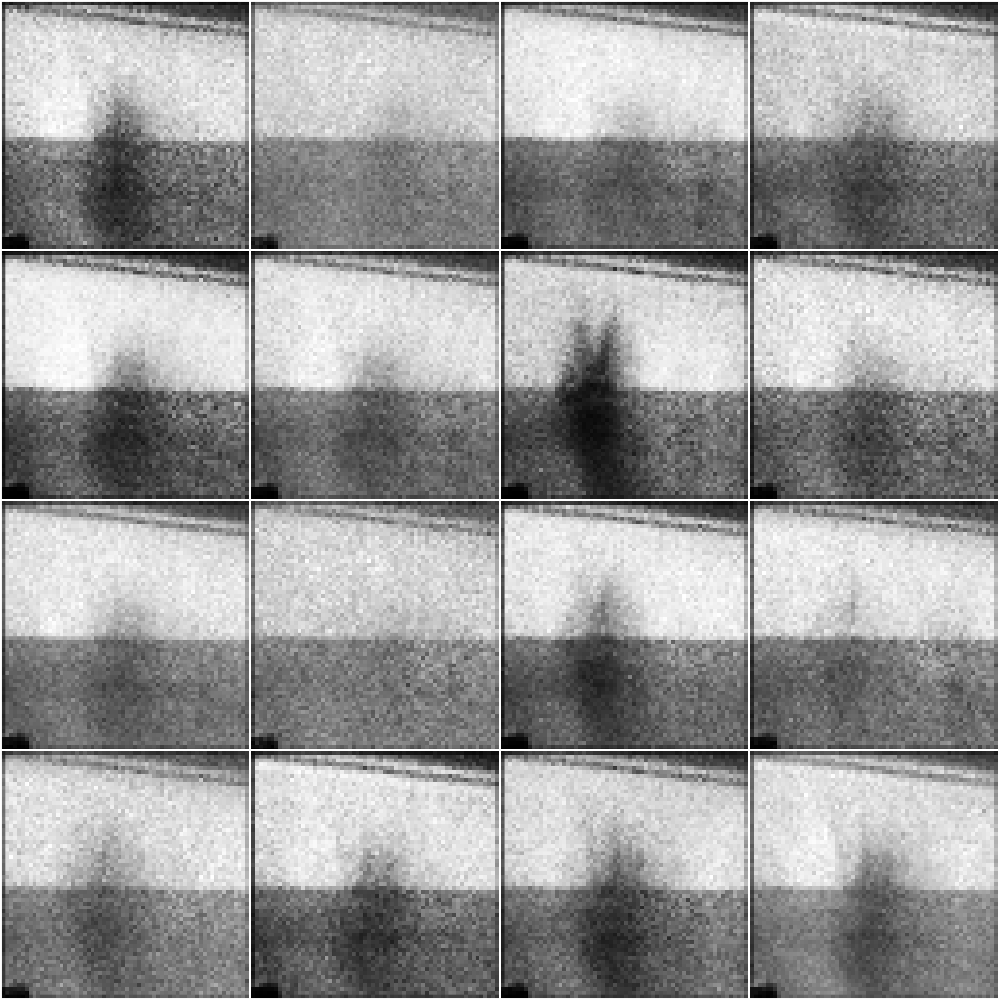

Starting training for letter: Q
Completed Epoch 1/50, Epoch Duration: 7.30s, Total Loss D.: 0.0637, Total Loss G.: 2.5118
Completed Epoch 2/50, Epoch Duration: 6.82s, Total Loss D.: 0.0228, Total Loss G.: 2.9414
Completed Epoch 3/50, Epoch Duration: 6.69s, Total Loss D.: 0.3438, Total Loss G.: 1.0573
Completed Epoch 4/50, Epoch Duration: 6.71s, Total Loss D.: 0.0535, Total Loss G.: 4.6360
Completed Epoch 5/50, Epoch Duration: 6.64s, Total Loss D.: 0.0208, Total Loss G.: 4.1032
Completed Epoch 6/50, Epoch Duration: 6.74s, Total Loss D.: 0.1391, Total Loss G.: 2.2968
Completed Epoch 7/50, Epoch Duration: 6.71s, Total Loss D.: 0.5729, Total Loss G.: 4.2579
Completed Epoch 8/50, Epoch Duration: 6.73s, Total Loss D.: 0.0511, Total Loss G.: 2.6757
Completed Epoch 9/50, Epoch Duration: 6.71s, Total Loss D.: 0.3636, Total Loss G.: 3.1482
Completed Epoch 10/50, Epoch Duration: 7.07s, Total Loss D.: 0.2988, Total Loss G.: 2.3798
Completed Epoch 11/50, Epoch Duration: 7.71s, Total Loss D.: 0.0775

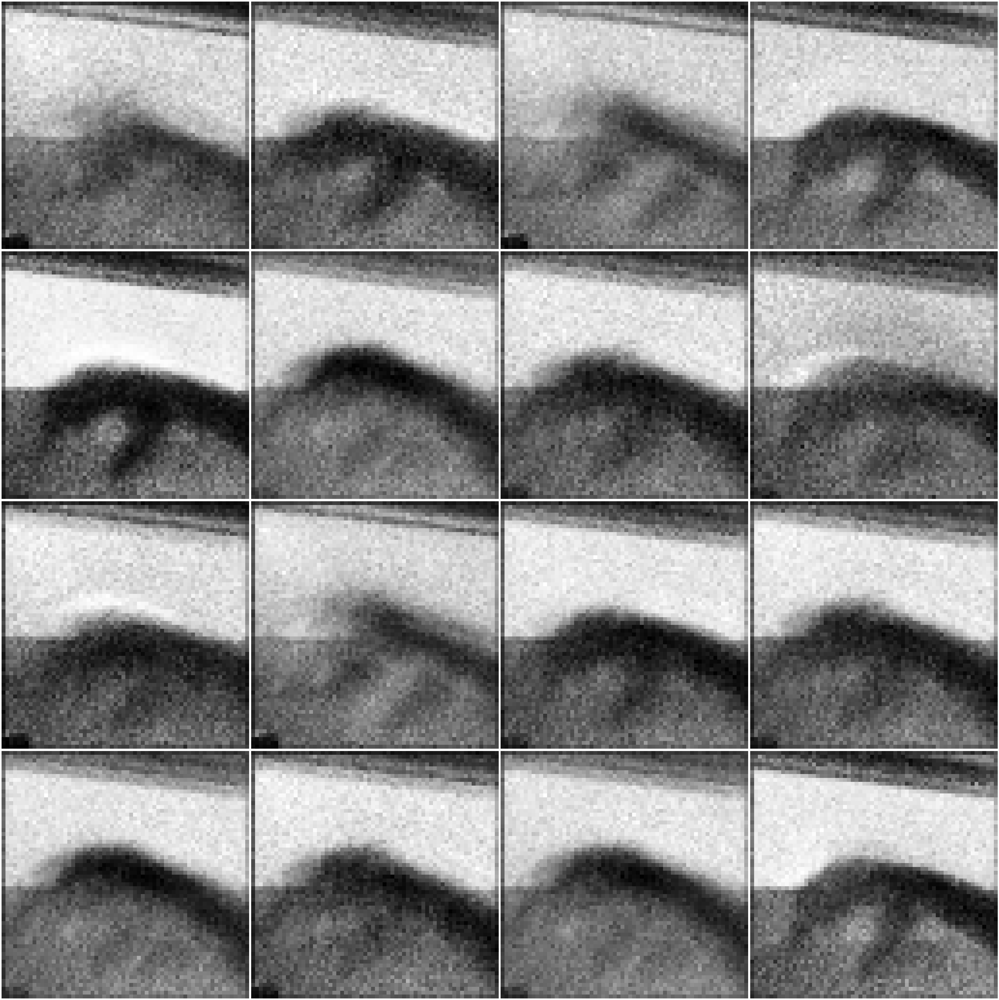

Starting training for letter: X
Completed Epoch 1/50, Epoch Duration: 7.28s, Total Loss D.: 0.0805, Total Loss G.: 2.7136
Completed Epoch 2/50, Epoch Duration: 6.68s, Total Loss D.: 0.0437, Total Loss G.: 2.3705
Completed Epoch 3/50, Epoch Duration: 6.78s, Total Loss D.: 0.5200, Total Loss G.: 2.8586
Completed Epoch 4/50, Epoch Duration: 6.72s, Total Loss D.: 0.1322, Total Loss G.: 3.7140
Completed Epoch 5/50, Epoch Duration: 6.64s, Total Loss D.: 0.0797, Total Loss G.: 3.4475
Completed Epoch 6/50, Epoch Duration: 6.68s, Total Loss D.: 0.1857, Total Loss G.: 2.2373
Completed Epoch 7/50, Epoch Duration: 6.69s, Total Loss D.: 0.1050, Total Loss G.: 2.1030
Completed Epoch 8/50, Epoch Duration: 6.68s, Total Loss D.: 0.2419, Total Loss G.: 1.9033
Completed Epoch 9/50, Epoch Duration: 6.68s, Total Loss D.: 0.2789, Total Loss G.: 1.9611
Completed Epoch 10/50, Epoch Duration: 6.72s, Total Loss D.: 0.0207, Total Loss G.: 4.6665
Completed Epoch 11/50, Epoch Duration: 6.69s, Total Loss D.: 0.0924

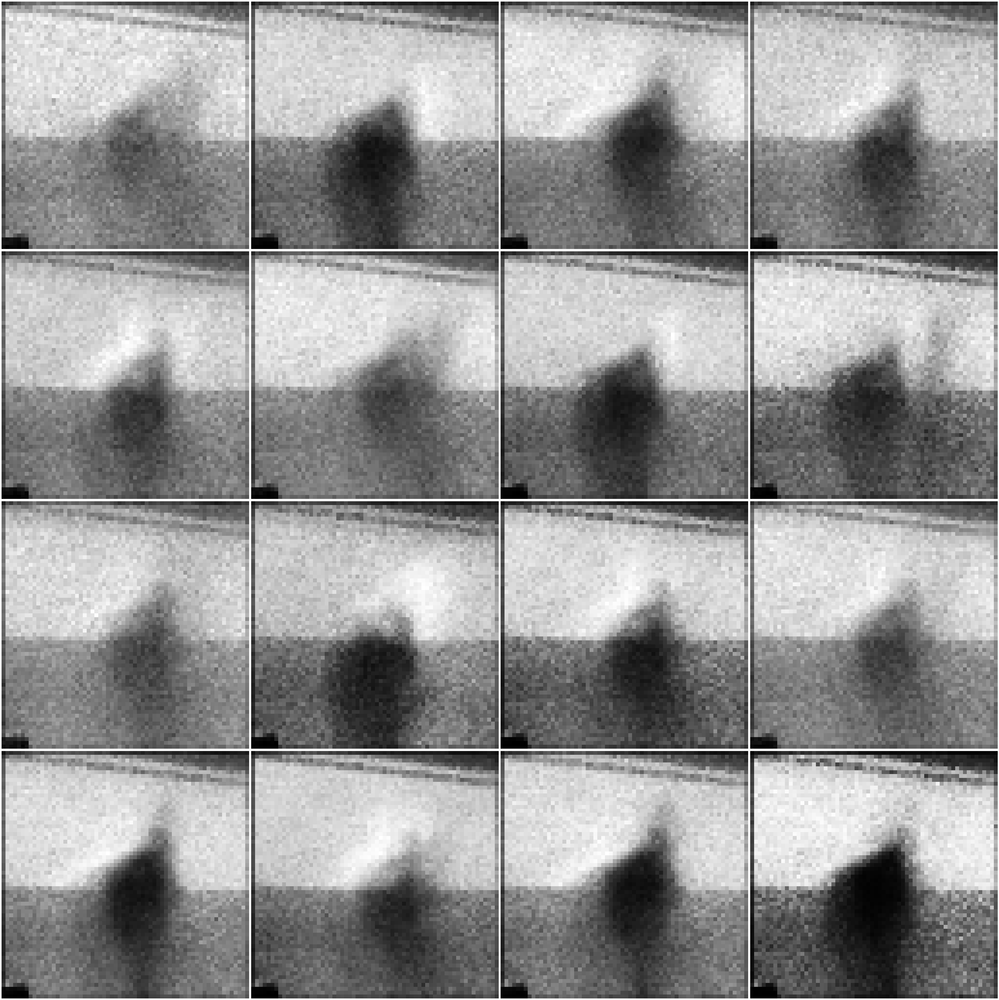

Starting training for letter: E
Completed Epoch 1/50, Epoch Duration: 7.32s, Total Loss D.: 0.0685, Total Loss G.: 2.3923
Completed Epoch 2/50, Epoch Duration: 6.66s, Total Loss D.: 0.0362, Total Loss G.: 2.8987
Completed Epoch 3/50, Epoch Duration: 7.00s, Total Loss D.: 0.1163, Total Loss G.: 4.0060
Completed Epoch 4/50, Epoch Duration: 6.89s, Total Loss D.: 0.0529, Total Loss G.: 2.7087
Completed Epoch 5/50, Epoch Duration: 6.80s, Total Loss D.: 0.0860, Total Loss G.: 3.4826
Completed Epoch 6/50, Epoch Duration: 6.71s, Total Loss D.: 0.0826, Total Loss G.: 2.5258
Completed Epoch 7/50, Epoch Duration: 6.64s, Total Loss D.: 0.0112, Total Loss G.: 4.3717
Completed Epoch 8/50, Epoch Duration: 6.70s, Total Loss D.: 0.0108, Total Loss G.: 4.9139
Completed Epoch 9/50, Epoch Duration: 6.86s, Total Loss D.: 0.0066, Total Loss G.: 7.8032
Completed Epoch 10/50, Epoch Duration: 6.91s, Total Loss D.: 0.0329, Total Loss G.: 4.3582
Completed Epoch 11/50, Epoch Duration: 6.64s, Total Loss D.: 0.1170

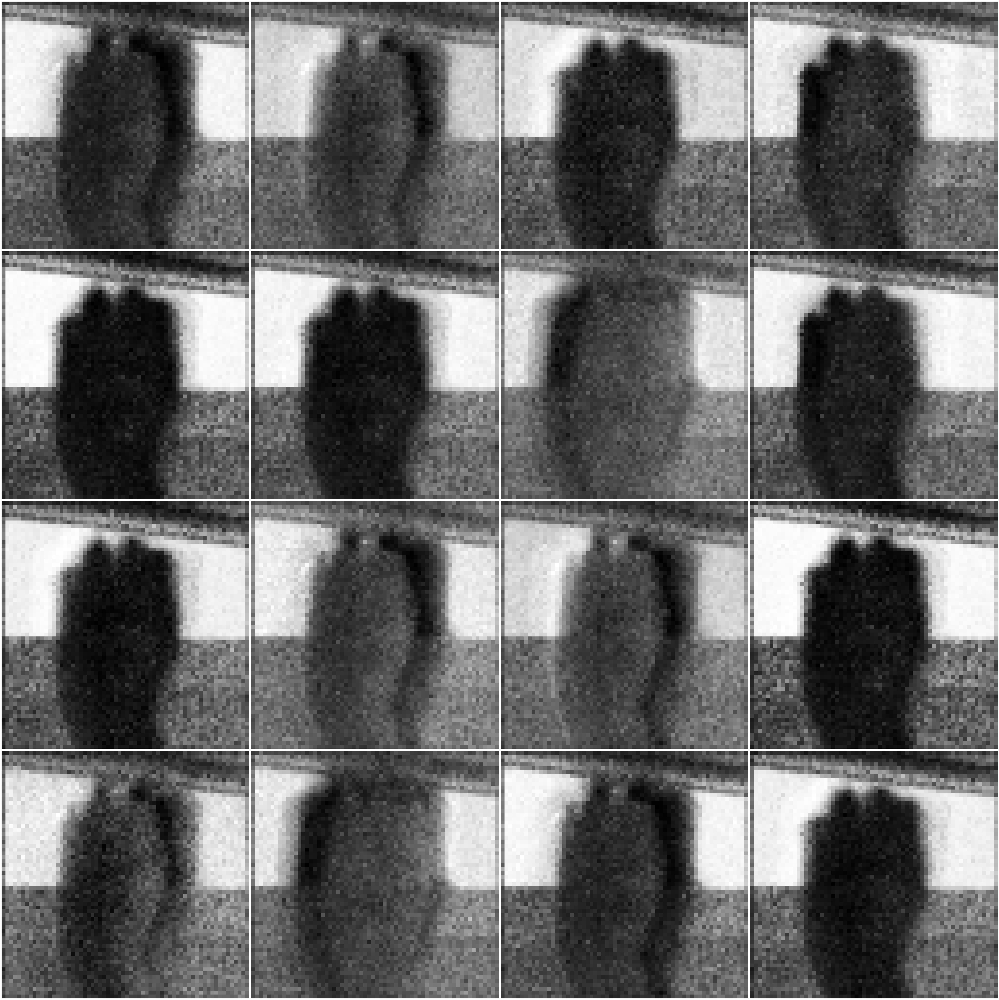

Starting training for letter: B
Completed Epoch 1/50, Epoch Duration: 7.13s, Total Loss D.: 0.0624, Total Loss G.: 2.5255
Completed Epoch 2/50, Epoch Duration: 6.52s, Total Loss D.: 0.0150, Total Loss G.: 3.7692
Completed Epoch 3/50, Epoch Duration: 6.58s, Total Loss D.: 0.0323, Total Loss G.: 3.0333
Completed Epoch 4/50, Epoch Duration: 6.49s, Total Loss D.: 0.0291, Total Loss G.: 4.4358
Completed Epoch 5/50, Epoch Duration: 6.52s, Total Loss D.: 0.0074, Total Loss G.: 6.8843
Completed Epoch 6/50, Epoch Duration: 6.63s, Total Loss D.: 0.2469, Total Loss G.: 3.8281
Completed Epoch 7/50, Epoch Duration: 6.60s, Total Loss D.: 0.2453, Total Loss G.: 5.9926
Completed Epoch 8/50, Epoch Duration: 6.59s, Total Loss D.: 0.2594, Total Loss G.: 2.8941
Completed Epoch 9/50, Epoch Duration: 6.66s, Total Loss D.: 0.0013, Total Loss G.: 7.7224
Completed Epoch 10/50, Epoch Duration: 6.70s, Total Loss D.: 0.0616, Total Loss G.: 8.4120
Completed Epoch 11/50, Epoch Duration: 6.52s, Total Loss D.: 0.0619

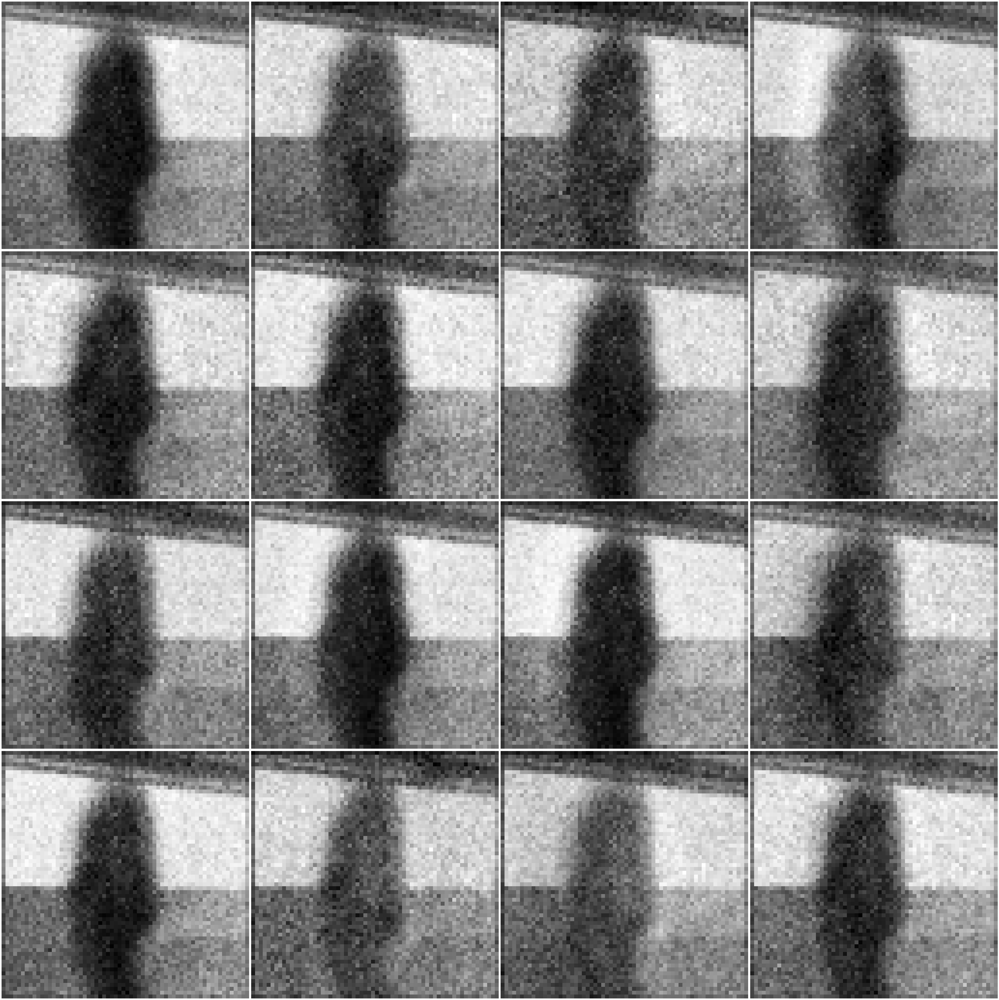

Starting training for letter: K
Completed Epoch 1/50, Epoch Duration: 7.28s, Total Loss D.: 0.0548, Total Loss G.: 2.7357
Completed Epoch 2/50, Epoch Duration: 6.64s, Total Loss D.: 0.0251, Total Loss G.: 3.2457
Completed Epoch 3/50, Epoch Duration: 6.79s, Total Loss D.: 0.0083, Total Loss G.: 5.9522
Completed Epoch 4/50, Epoch Duration: 6.67s, Total Loss D.: 0.0165, Total Loss G.: 4.6438
Completed Epoch 5/50, Epoch Duration: 6.85s, Total Loss D.: 0.0539, Total Loss G.: 4.5080
Completed Epoch 6/50, Epoch Duration: 6.76s, Total Loss D.: 0.7388, Total Loss G.: 2.5012
Completed Epoch 7/50, Epoch Duration: 6.76s, Total Loss D.: 0.0683, Total Loss G.: 3.2072
Completed Epoch 8/50, Epoch Duration: 7.04s, Total Loss D.: 0.0202, Total Loss G.: 3.1202
Completed Epoch 9/50, Epoch Duration: 6.88s, Total Loss D.: 0.0582, Total Loss G.: 3.2766
Completed Epoch 10/50, Epoch Duration: 6.73s, Total Loss D.: 0.1499, Total Loss G.: 1.9302
Completed Epoch 11/50, Epoch Duration: 6.74s, Total Loss D.: 0.0505

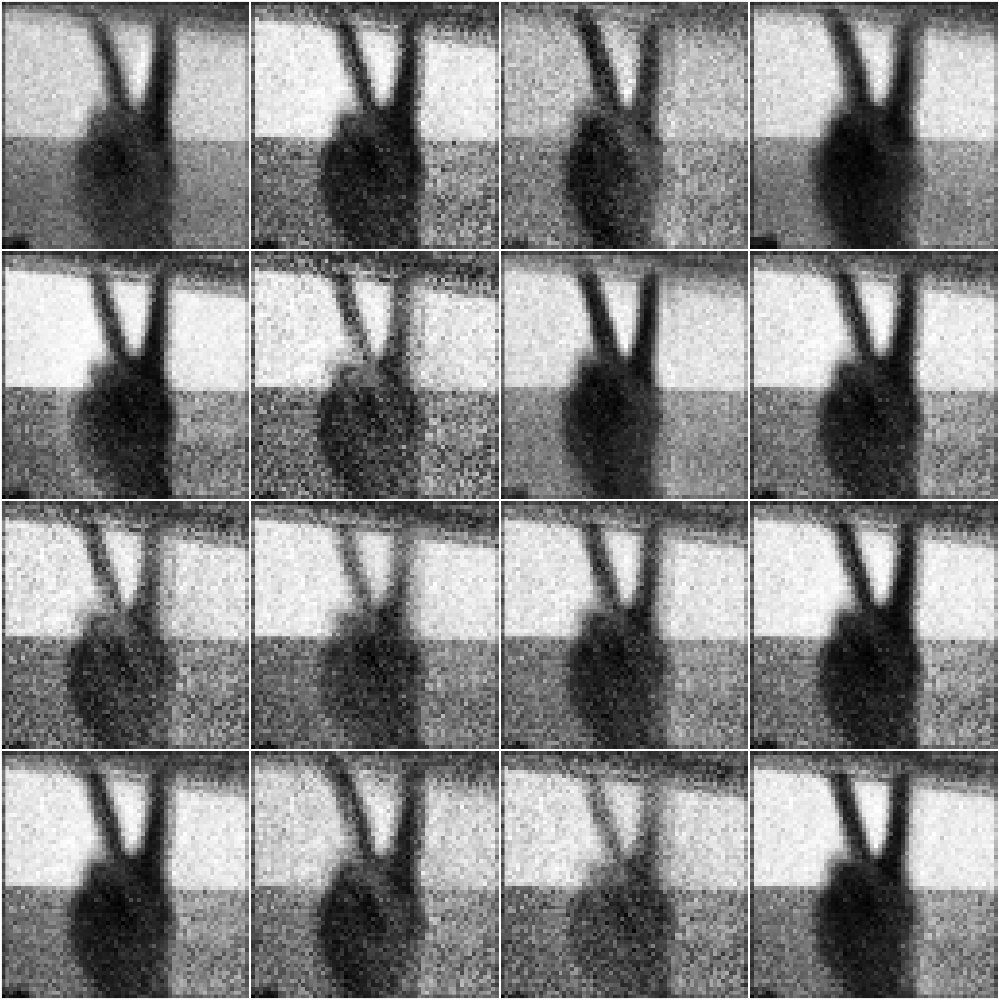

Starting training for letter: L
Completed Epoch 1/50, Epoch Duration: 7.25s, Total Loss D.: 0.0876, Total Loss G.: 1.9803
Completed Epoch 2/50, Epoch Duration: 6.64s, Total Loss D.: 0.0467, Total Loss G.: 2.5453
Completed Epoch 3/50, Epoch Duration: 6.80s, Total Loss D.: 0.0466, Total Loss G.: 5.1780
Completed Epoch 4/50, Epoch Duration: 6.66s, Total Loss D.: 0.0399, Total Loss G.: 3.3152
Completed Epoch 5/50, Epoch Duration: 6.68s, Total Loss D.: 0.0359, Total Loss G.: 3.5290
Completed Epoch 6/50, Epoch Duration: 6.67s, Total Loss D.: 0.3304, Total Loss G.: 6.4495
Completed Epoch 7/50, Epoch Duration: 6.64s, Total Loss D.: 0.1947, Total Loss G.: 1.5302
Completed Epoch 8/50, Epoch Duration: 6.57s, Total Loss D.: 0.2728, Total Loss G.: 1.0978
Completed Epoch 9/50, Epoch Duration: 6.71s, Total Loss D.: 0.2559, Total Loss G.: 1.1130
Completed Epoch 10/50, Epoch Duration: 6.61s, Total Loss D.: 0.2084, Total Loss G.: 1.2471
Completed Epoch 11/50, Epoch Duration: 6.74s, Total Loss D.: 0.1120

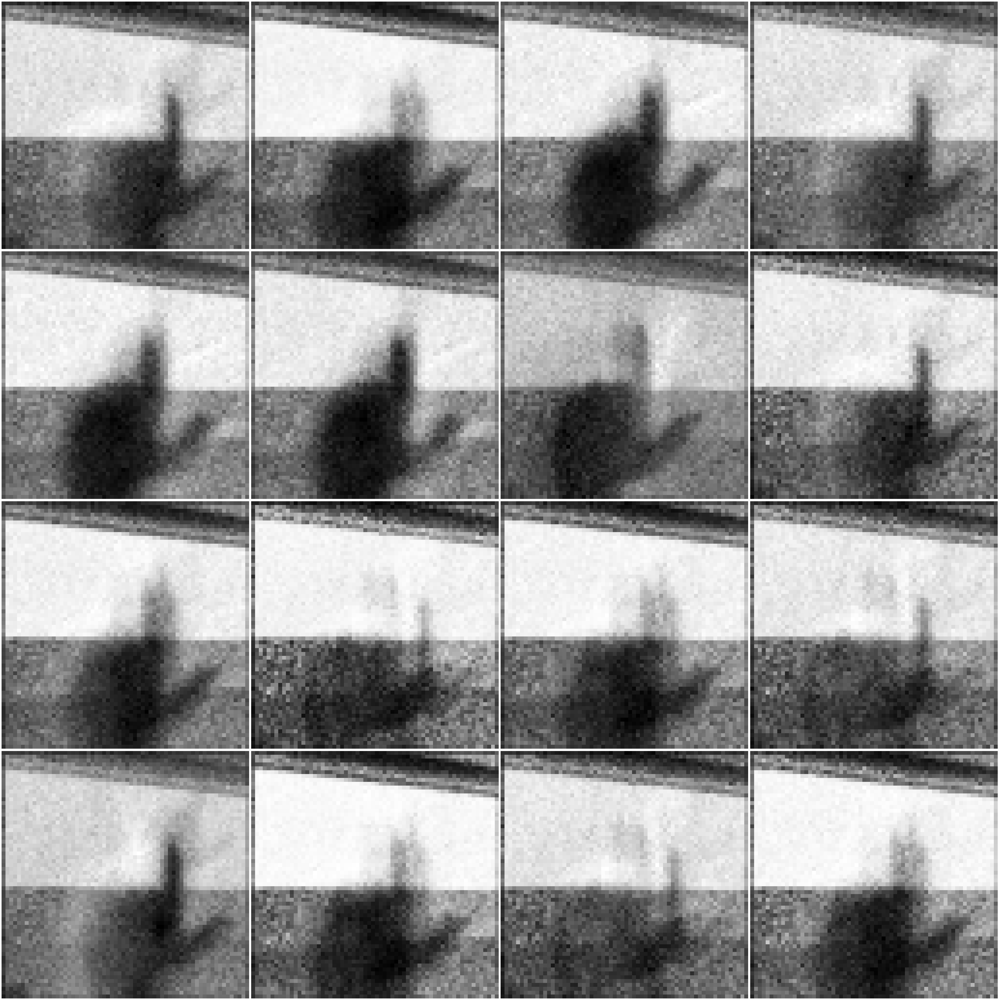

Starting training for letter: Y
Completed Epoch 1/50, Epoch Duration: 7.27s, Total Loss D.: 0.0664, Total Loss G.: 2.4788
Completed Epoch 2/50, Epoch Duration: 6.79s, Total Loss D.: 0.0428, Total Loss G.: 2.8722
Completed Epoch 3/50, Epoch Duration: 6.58s, Total Loss D.: 0.0472, Total Loss G.: 4.2986
Completed Epoch 4/50, Epoch Duration: 6.99s, Total Loss D.: 0.4886, Total Loss G.: 2.1609
Completed Epoch 5/50, Epoch Duration: 6.87s, Total Loss D.: 0.1662, Total Loss G.: 2.1874
Completed Epoch 6/50, Epoch Duration: 6.77s, Total Loss D.: 0.4704, Total Loss G.: 1.7489
Completed Epoch 7/50, Epoch Duration: 6.65s, Total Loss D.: 0.5108, Total Loss G.: 2.5507
Completed Epoch 8/50, Epoch Duration: 6.81s, Total Loss D.: 0.0778, Total Loss G.: 4.1780
Completed Epoch 9/50, Epoch Duration: 7.32s, Total Loss D.: 0.0386, Total Loss G.: 8.5781
Completed Epoch 10/50, Epoch Duration: 6.63s, Total Loss D.: 0.1350, Total Loss G.: 12.7216
Completed Epoch 11/50, Epoch Duration: 6.81s, Total Loss D.: 0.203

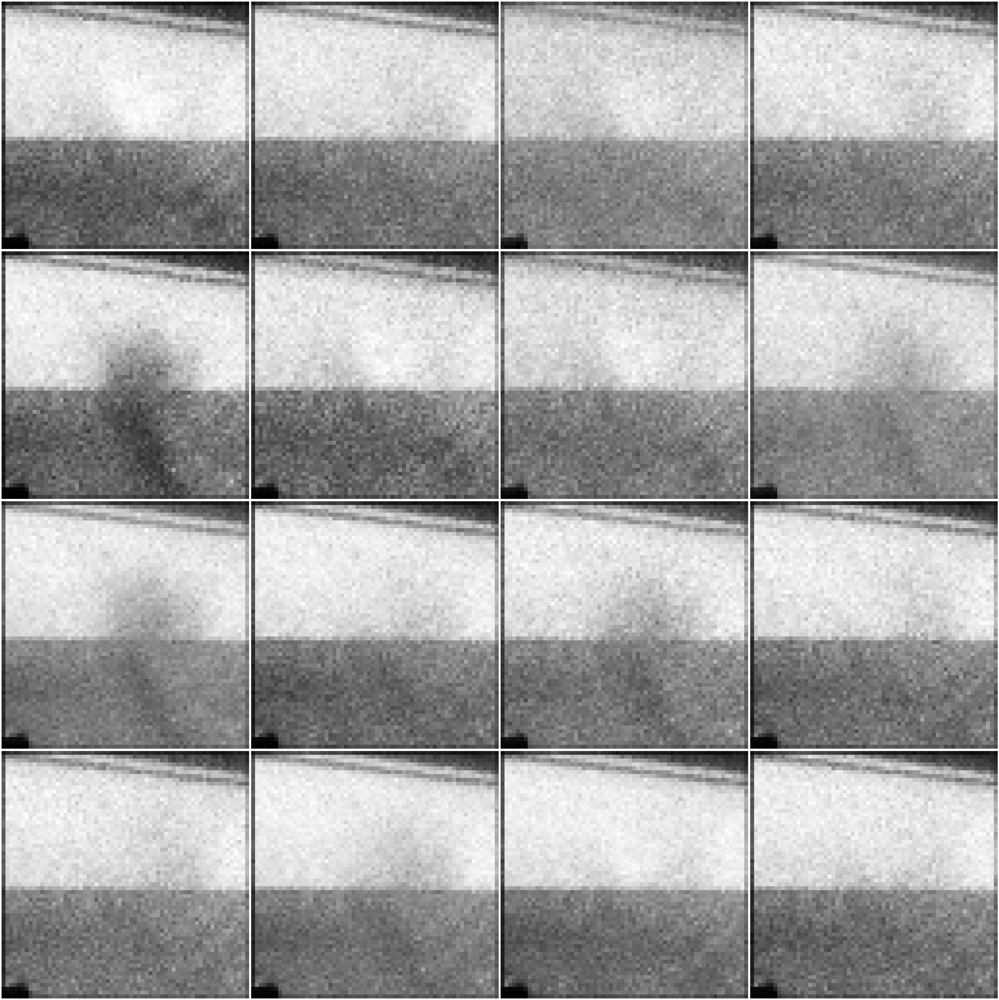

Starting training for letter: P
Completed Epoch 1/50, Epoch Duration: 9.06s, Total Loss D.: 0.0740, Total Loss G.: 2.2630
Completed Epoch 2/50, Epoch Duration: 8.35s, Total Loss D.: 0.0446, Total Loss G.: 3.1965
Completed Epoch 3/50, Epoch Duration: 7.88s, Total Loss D.: 0.0793, Total Loss G.: 2.6003
Completed Epoch 4/50, Epoch Duration: 7.45s, Total Loss D.: 0.0132, Total Loss G.: 8.7651
Completed Epoch 5/50, Epoch Duration: 6.78s, Total Loss D.: 0.0412, Total Loss G.: 4.0725
Completed Epoch 6/50, Epoch Duration: 6.65s, Total Loss D.: 0.0125, Total Loss G.: 4.2871
Completed Epoch 7/50, Epoch Duration: 6.81s, Total Loss D.: 0.2972, Total Loss G.: 1.7147
Completed Epoch 8/50, Epoch Duration: 6.58s, Total Loss D.: 0.4842, Total Loss G.: 2.8367
Completed Epoch 9/50, Epoch Duration: 6.62s, Total Loss D.: 0.0311, Total Loss G.: 4.5293
Completed Epoch 10/50, Epoch Duration: 6.55s, Total Loss D.: 0.0237, Total Loss G.: 6.0963
Completed Epoch 11/50, Epoch Duration: 6.62s, Total Loss D.: 0.0017

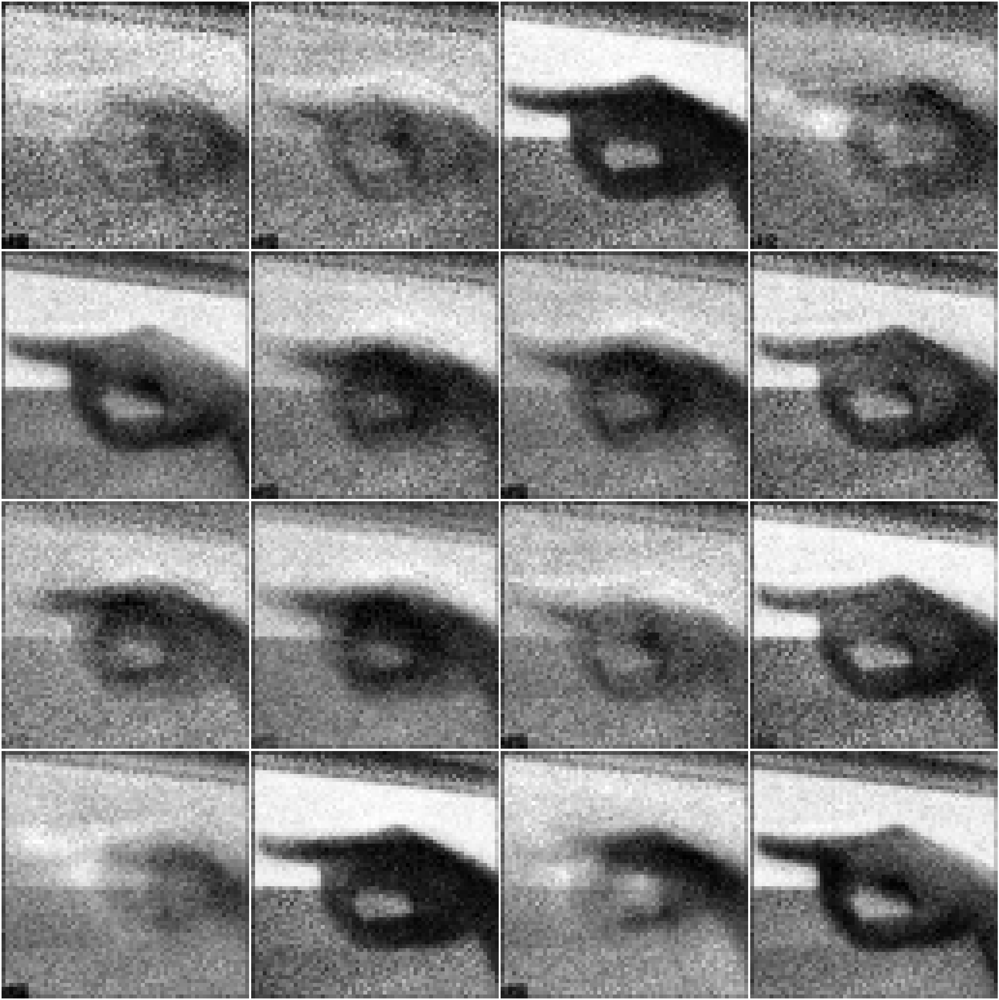

Starting training for letter: W
Completed Epoch 1/50, Epoch Duration: 7.25s, Total Loss D.: 0.0919, Total Loss G.: 1.9950
Completed Epoch 2/50, Epoch Duration: 7.15s, Total Loss D.: 0.0369, Total Loss G.: 2.6265
Completed Epoch 3/50, Epoch Duration: 7.37s, Total Loss D.: 0.1114, Total Loss G.: 1.8670
Completed Epoch 4/50, Epoch Duration: 7.62s, Total Loss D.: 0.5862, Total Loss G.: 1.1180
Completed Epoch 5/50, Epoch Duration: 7.49s, Total Loss D.: 0.0866, Total Loss G.: 2.4705
Completed Epoch 6/50, Epoch Duration: 7.48s, Total Loss D.: 0.4436, Total Loss G.: 1.2983
Completed Epoch 7/50, Epoch Duration: 7.49s, Total Loss D.: 0.0890, Total Loss G.: 3.8479
Completed Epoch 8/50, Epoch Duration: 7.54s, Total Loss D.: 0.1878, Total Loss G.: 3.9685
Completed Epoch 9/50, Epoch Duration: 7.62s, Total Loss D.: 0.1102, Total Loss G.: 2.1645
Completed Epoch 10/50, Epoch Duration: 7.43s, Total Loss D.: 0.1471, Total Loss G.: 2.4061
Completed Epoch 11/50, Epoch Duration: 8.38s, Total Loss D.: 0.0419

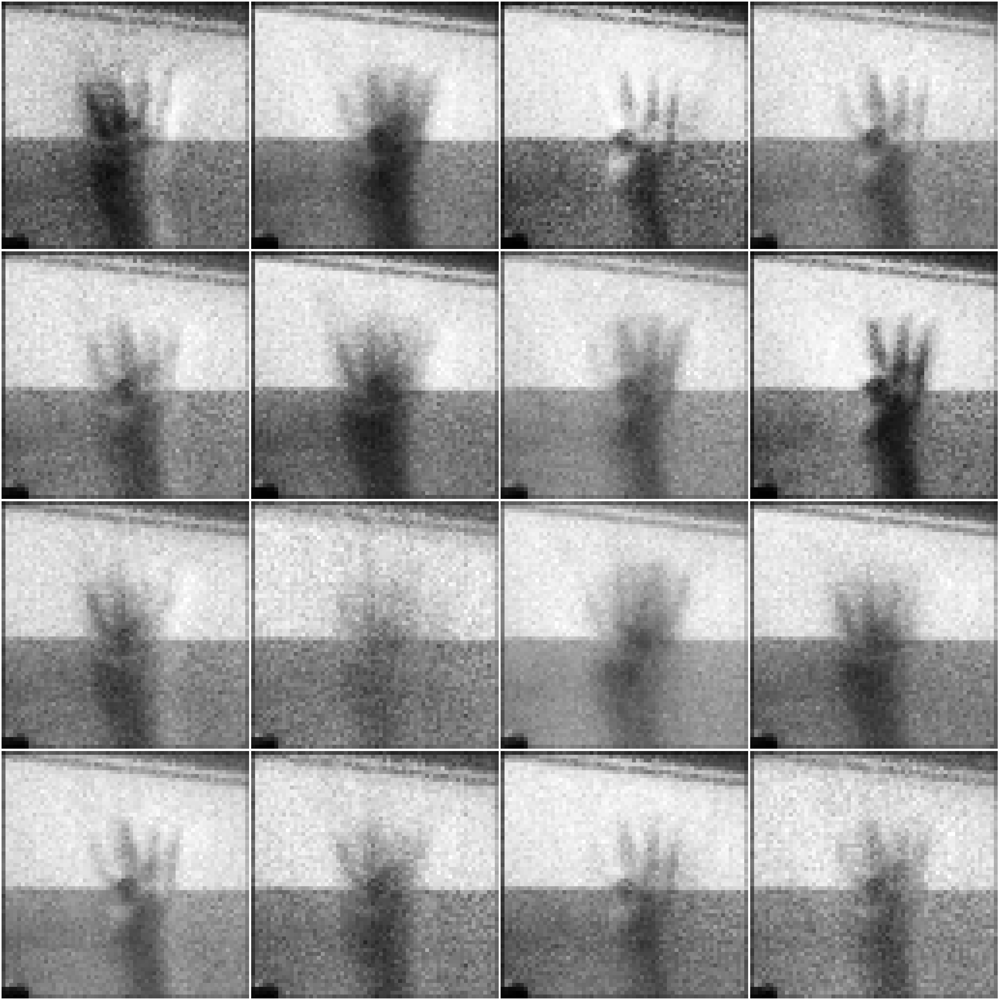

In [12]:
for letter, dataloader in gan_dataloaders.items():
    print(f"Starting training for letter: {letter}")
    
    generator = Generator().to(device)
    discriminator = Discriminator().to(device)
    
    
    # define hyperparameters
    lr = 0.0001
    num_epochs = 50
    loss_function = nn.BCELoss()
    optimizer_discriminator = torch.optim.Adam(discriminator.parameters(), lr=lr)
    optimizer_generator = torch.optim.Adam(generator.parameters(), lr=lr)
    
    # training loop
    for epoch in range(num_epochs):
        start_time_epoch = time.time()
        for n, (real_samples, _) in enumerate(dataloader):
                start_time_batch = time.time()

                batch_size_current = real_samples.size(0)
                real_samples = real_samples.to(device=device)
                real_samples_labels = torch.ones((batch_size_current, 1), device=device)
                
                # generate samples and corresponding images
                latent_space_samples = torch.randn((batch_size_current, 100), device=device)
                generated_samples = generator(latent_space_samples)
                generated_samples_labels = torch.zeros((batch_size_current, 1), device=device)

                all_samples = torch.cat((real_samples, generated_samples), dim=0)
                all_samples_labels = torch.cat((real_samples_labels, generated_samples_labels), dim=0)

                discriminator.zero_grad()

                # obtain discriminator predictions and update discriminator parameters
                output_discriminator = discriminator(all_samples)
                loss_discriminator = loss_function(output_discriminator, all_samples_labels)
                loss_discriminator.backward()
                optimizer_discriminator.step()

                # generate new samples and update generator parameters
                generator.zero_grad()
                latent_space_samples = torch.randn((batch_size_current, 100), device=device)
                generated_samples = generator(latent_space_samples)
                output_discriminator_generated = discriminator(generated_samples)
                loss_generator = loss_function(output_discriminator_generated, real_samples_labels) 
                loss_generator.backward()
                optimizer_generator.step()

                end_time_batch = time.time()
                batch_duration = end_time_batch - start_time_batch


        end_time_epoch = time.time()
        epoch_duration = end_time_epoch - start_time_epoch 
        print(f"Completed Epoch {epoch+1}/{num_epochs}, "
            f"Epoch Duration: {epoch_duration:.2f}s, "
            f"Total Loss D.: {loss_discriminator.item():.4f}, " 
            f"Total Loss G.: {loss_generator.item():.4f}")
        
    latent_space_samples = torch.randn(32, 100).to(device=device)
    generated_samples = generator(latent_space_samples) 
    generated_samples = generated_samples.cpu().detach()
    
    images_dict[letter.lower()] = generated_samples
    
    show_asl(16, 4, 4, generated_samples)

In [20]:
# display images cororesponding to input word
def display_images(word):
    word = word.lower()
    num_letters = len(word)
    if num_letters == 0:
        print("Please enter a word to display the images.")
        return

    if num_letters == 1:
        fig, axs = plt.subplots(1, 1, figsize=(3, 4))
        axs = [axs]  
    else:
        fig, axs = plt.subplots(1, num_letters, figsize=(3 * num_letters, 4))

    for i, letter in enumerate(word):
        img_tensor = images_dict.get(letter, None)
        if img_tensor is not None:
            axs[i].imshow(img_tensor[10].reshape(64, 64), cmap='gray')
            axs[i].set_title(f'Letter: {letter}')
        else:
            axs[i].text(0.5, 0.5, ' ', fontsize=15, ha='center')
        axs[i].axis('off')
    plt.show()

# define input textbox widget
text_box = widgets.Text(
    value='',
    placeholder='Type something',
    description='Input:',
    disabled=False
)

output = widgets.Output()

# define event handler for text change
def on_text_change(change):
    with output:
        clear_output(wait=True)
        display_images(change['new'])

text_box.observe(on_text_change, names='value')

# display widgets
display(text_box, output)

Text(value='', description='Input:', placeholder='Type something')

Output()